In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/g-research-crypto-forecasting/example_sample_submission.csv
/kaggle/input/g-research-crypto-forecasting/asset_details.csv
/kaggle/input/g-research-crypto-forecasting/example_test.csv
/kaggle/input/g-research-crypto-forecasting/train.csv
/kaggle/input/g-research-crypto-forecasting/supplemental_train.csv
/kaggle/input/g-research-crypto-forecasting/gresearch_crypto/competition.cpython-37m-x86_64-linux-gnu.so
/kaggle/input/g-research-crypto-forecasting/gresearch_crypto/__init__.py
/kaggle/input/mastercard-stock-data-latest-and-updated/Mastercard_stock_info.csv
/kaggle/input/mastercard-stock-data-latest-and-updated/Mastercard_stock_history.csv


# 1. Import Libraries

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# For reading stock data from yahoo
from pandas_datareader.data import DataReader
   
# For time stamps
from datetime import datetime
from math import sqrt
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

#ignore the warnings
import warnings
warnings.filterwarnings('ignore')

# 2. Load Dataset

In [3]:
data_folder = "../input/g-research-crypto-forecasting/"
crypto_df = pd.read_csv(data_folder + 'train.csv')

crypto_df.head(10)


,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
0,1514764860,2,40.0,2376.580000,2399.5000,2357.1400,2374.590000,19.233005,2373.116392,-0.004218
1,1514764860,0,5.0,8.530000,8.5300,8.5300,8.530000,78.380000,8.530000,-0.014399
2,1514764860,1,229.0,13835.194000,14013.8000,13666.1100,13850.176000,31.550062,13827.062093,-0.014643
3,1514764860,5,32.0,7.659600,7.6596,7.6567,7.657600,6626.713370,7.657713,-0.013922
4,1514764860,7,5.0,25.920000,25.9200,25.8740,25.877000,121.087310,25.891363,-0.008264
5,1514764860,6,173.0,738.302500,746.0000,732.5100,738.507500,335.987856,738.839291,-0.004809
6,1514764860,9,167.0,225.330000,227.7800,222.9800,225.206667,411.896642,225.197944,-0.009791
7,1514764860,11,7.0,329.090000,329.8800,329.0900,329.460000,6.635710,329.454118,NaN
8,1514764920,2,53.0,2374.553333,2400.9000,2354.2000,2372.286667,24.050259,2371.434498,-0.004079
9,1514764920,0,7.0,8.530000,8.5300,8.5145,8.514500,71.390000,8.520215,-0.015875


## Data features

#### Features
* timestamp: All timestamps are returned as second Unix timestamps (the number of seconds elapsed since 1970-01-01 00:00:00.000 UTC). Timestamps in this dataset are multiple of 60, indicating minute-by-minute data.
* Asset_ID: The asset ID corresponding to one of the crytocurrencies (e.g. Asset_ID = 1 for Bitcoin). The mapping from Asset_ID to crypto asset is contained in asset_details.csv.
* Count: Total number of trades in the time interval (last minute).
* Open: Opening price of the time interval (in USD).
* High: Highest price reached during time interval (in USD).
* Low: Lowest price reached during time interval (in USD).
* Close: Closing price of the time interval (in USD).
* Volume: Quantity of asset bought or sold, displayed in base currency USD.
* VWAP: The average price of the asset over the time interval, weighted by volume. VWAP is an aggregated form of trade data.
* Target: Residual log-returns for the asset over a 15 minute horizon.




In [4]:
import seaborn as sns
#cm = sns.light_palette("viridis", as_cmap=True)

asset_details = pd.read_csv(data_folder + 'asset_details.csv')
#asset_details.style.bar()
asset_details.style.background_gradient(cmap='gist_rainbow_r')

,Asset_ID,Weight,Asset_Name
0,2,2.397895,Bitcoin Cash
1,0,4.304065,Binance Coin
2,1,6.779922,Bitcoin
3,5,1.386294,EOS.IO
4,7,2.079442,Ethereum Classic
5,6,5.894403,Ethereum
6,9,2.397895,Litecoin
7,11,1.609438,Monero
8,13,1.791759,TRON
9,12,2.079442,Stellar


# 3. Basic EDA

In [5]:
crypto_df['timestamp'] = pd.to_datetime(crypto_df['timestamp'], unit='s')
crypto_df.rename({'timestamp': 'Date'}, axis=1, inplace=True)

In [6]:
def crypto_df_subset(asset_id ,data):
    df = data[data["Asset_ID"]==asset_id] #.set_index("Date")
    return df

In [7]:
import random 

def plot_close_val(data_frame, column, stock):
    sns.set_style('whitegrid')
    plt.style.use("fivethirtyeight")
    plt.figure(figsize=(16,6))
    plt.title(column + ' Price History for ' + stock )
    plt.plot(data_frame[column],color="#"+''.join([random.choice('ABCDEF0123456789') for i in range(6)]))
    plt.xlabel('Date', fontsize=18)
    plt.ylabel(column + ' for' + stock, fontsize=18)
    plt.show()



In [8]:
try:
    import mplfinance as mpf
except:
    !pip -q install mplfinance
    import mplfinance as mpf

In [9]:
def mplplot(data_frame, stock):
    titletext =  stock + 'MPL Finance OHLC Plot'
    mpf.plot(data_frame,type='candle',volume=True, mav=(7,14,28),figratio=(5,2), style='charles',title= titletext)

In [10]:

crypto_df['Date'] = pd.to_datetime(crypto_df.Date, utc=False)

In [11]:
crypto_df.head()
def time_series_features(df, dt_col='Date', label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['hour'] = df[dt_col].dt.hour
    df['dayofweek'] = df[dt_col].dt.dayofweek
    df['quarter'] = df[dt_col].dt.quarter
    df['month'] = df[dt_col].dt.month
    df['year'] = df[dt_col].dt.year
    df['dayofyear'] = df[dt_col].dt.dayofyear
    df['dayofmonth'] = df[dt_col].dt.day
    df['weekofyear'] = df[dt_col].dt.isocalendar().week
    return df

crypto_df = time_series_features(crypto_df)

In [12]:
def sn_pairplot(subsett):
    ax = sns.pairplot(subsett,
                      hue='year',
                      vars=['Volume',
                            'Count',
                            'VWAP',
                            'Target',
                           ])

Bitcoin Cash


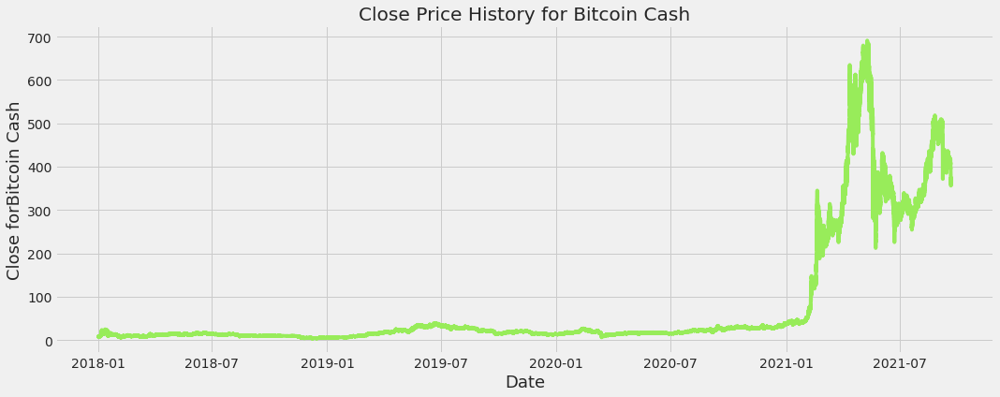

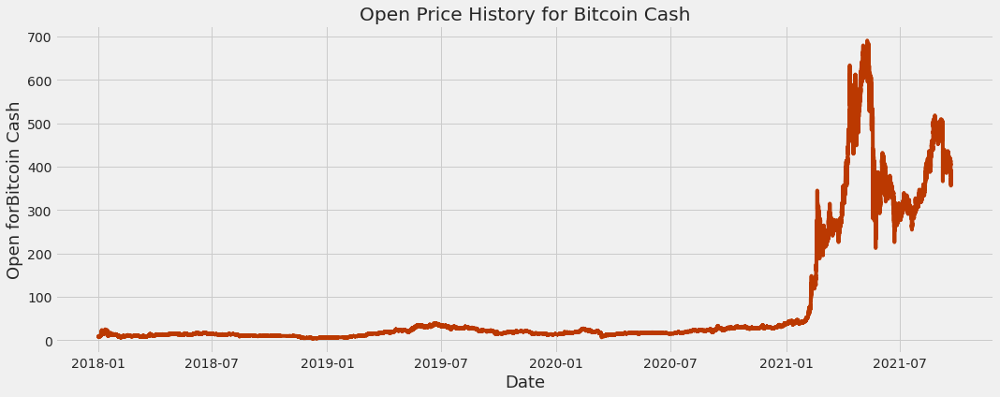

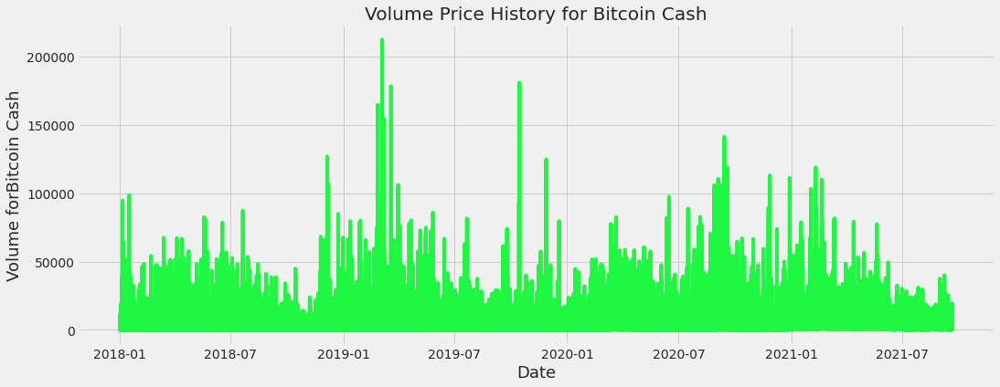

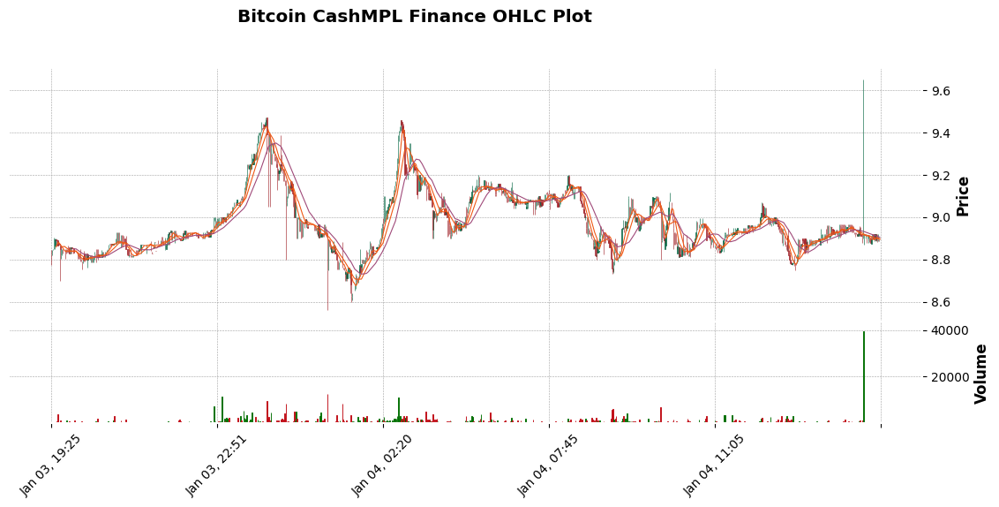

Binance Coin


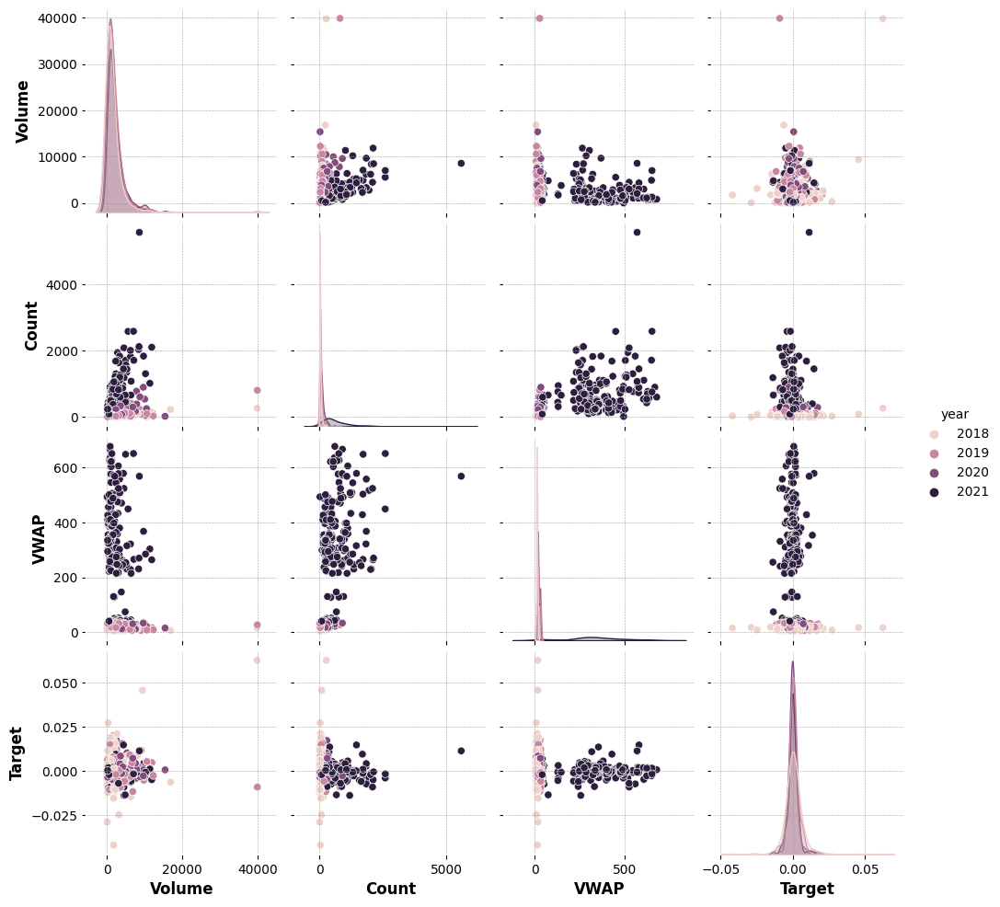

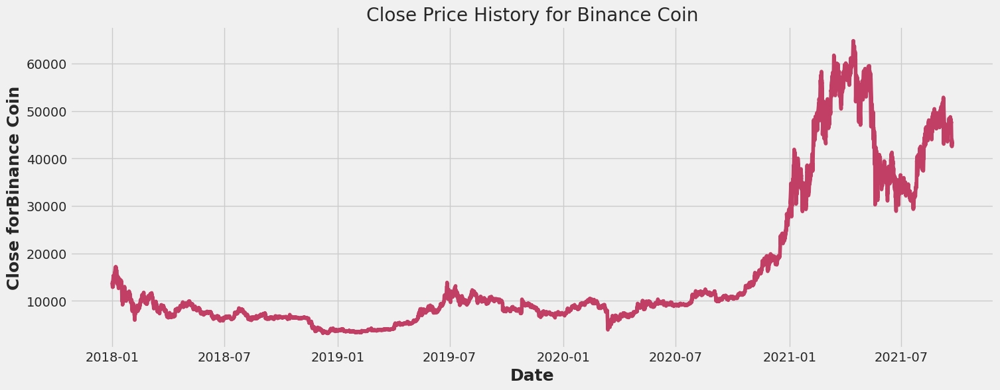

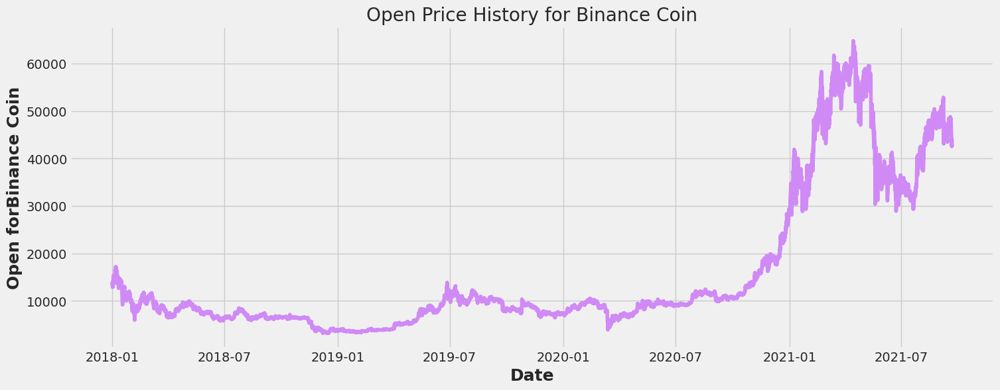

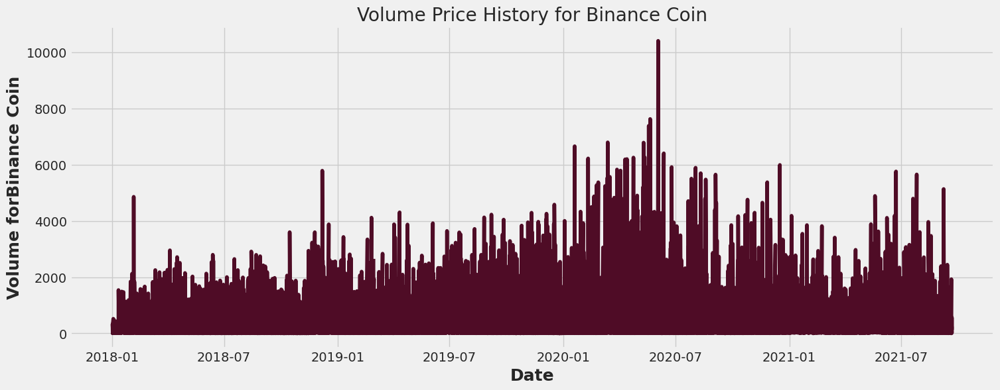

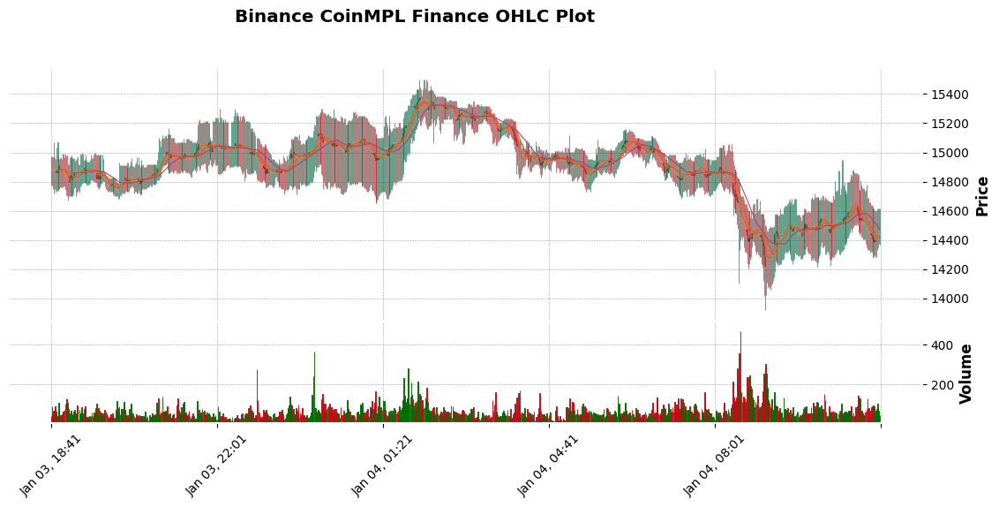

Bitcoin


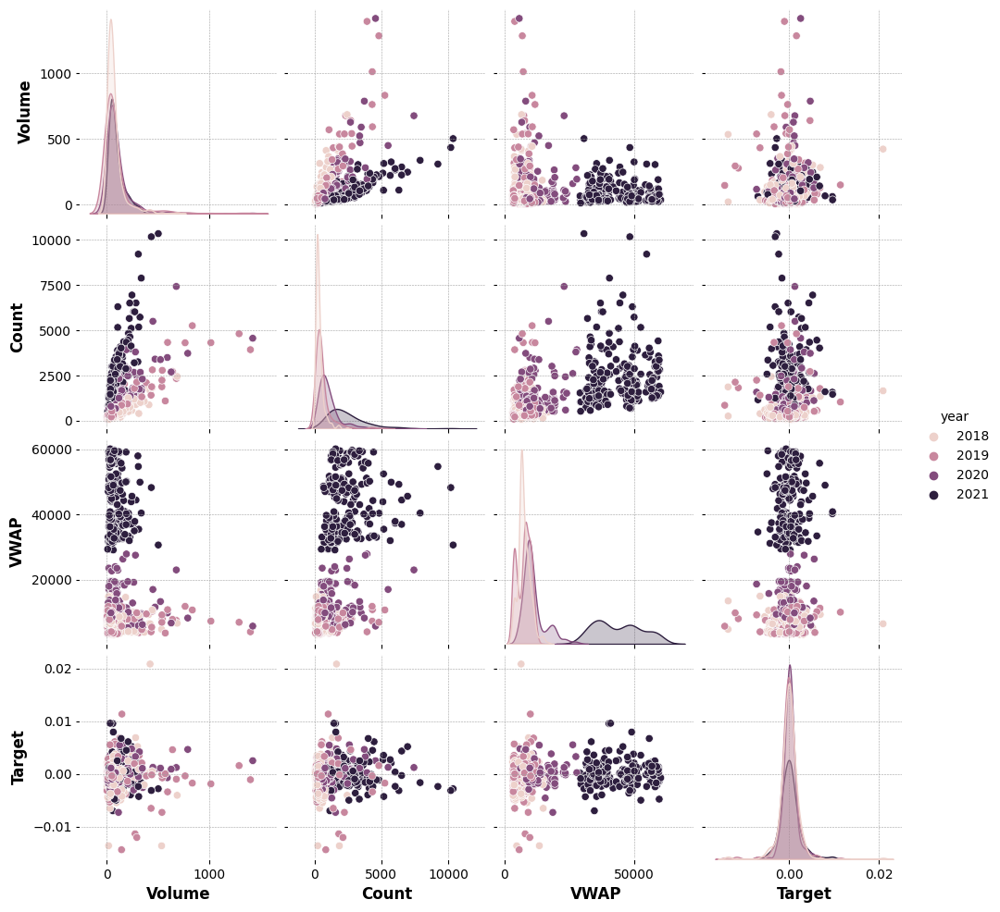

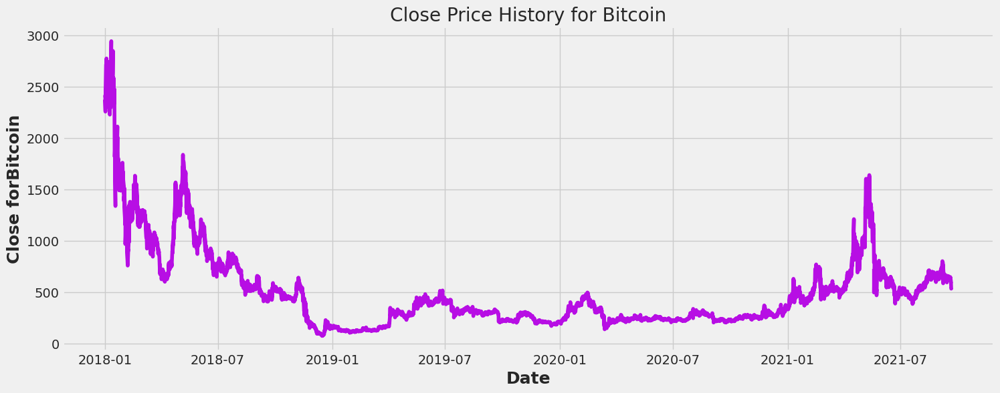

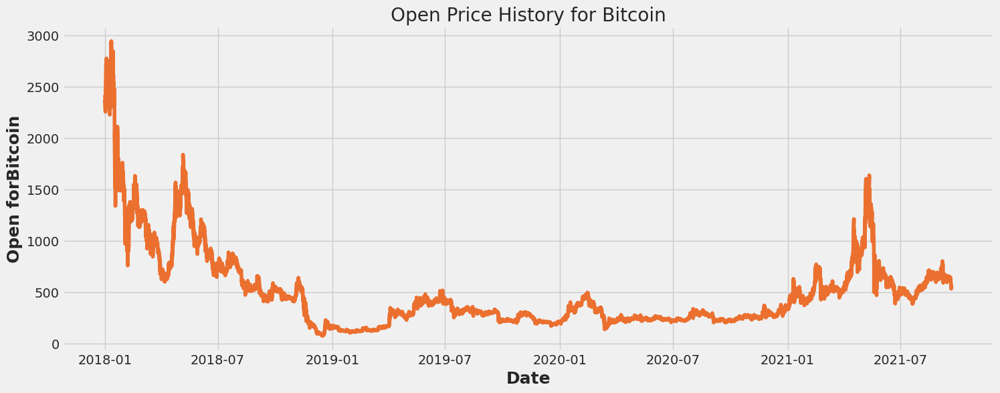

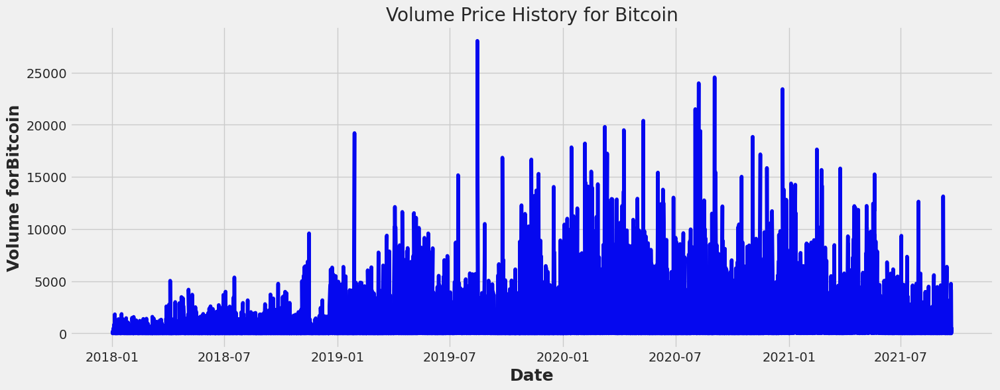

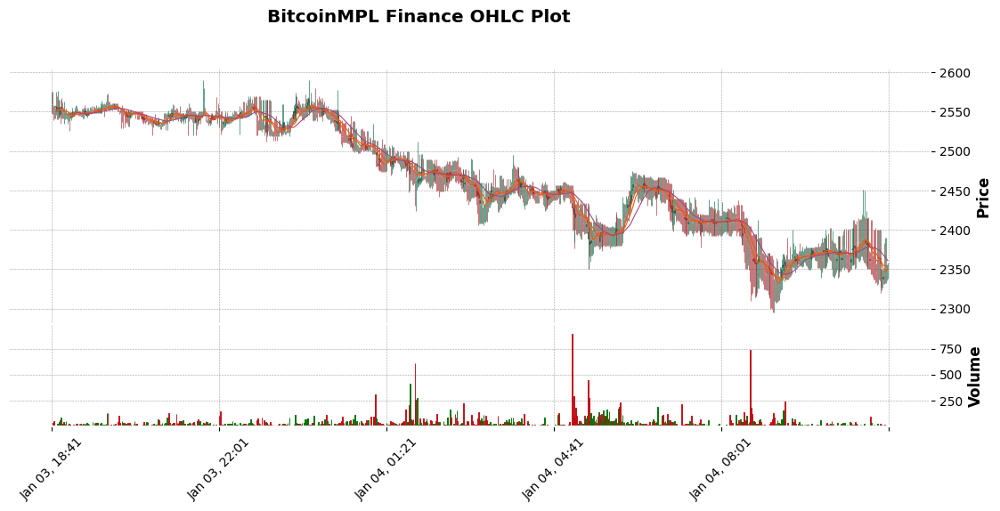

EOS.IO


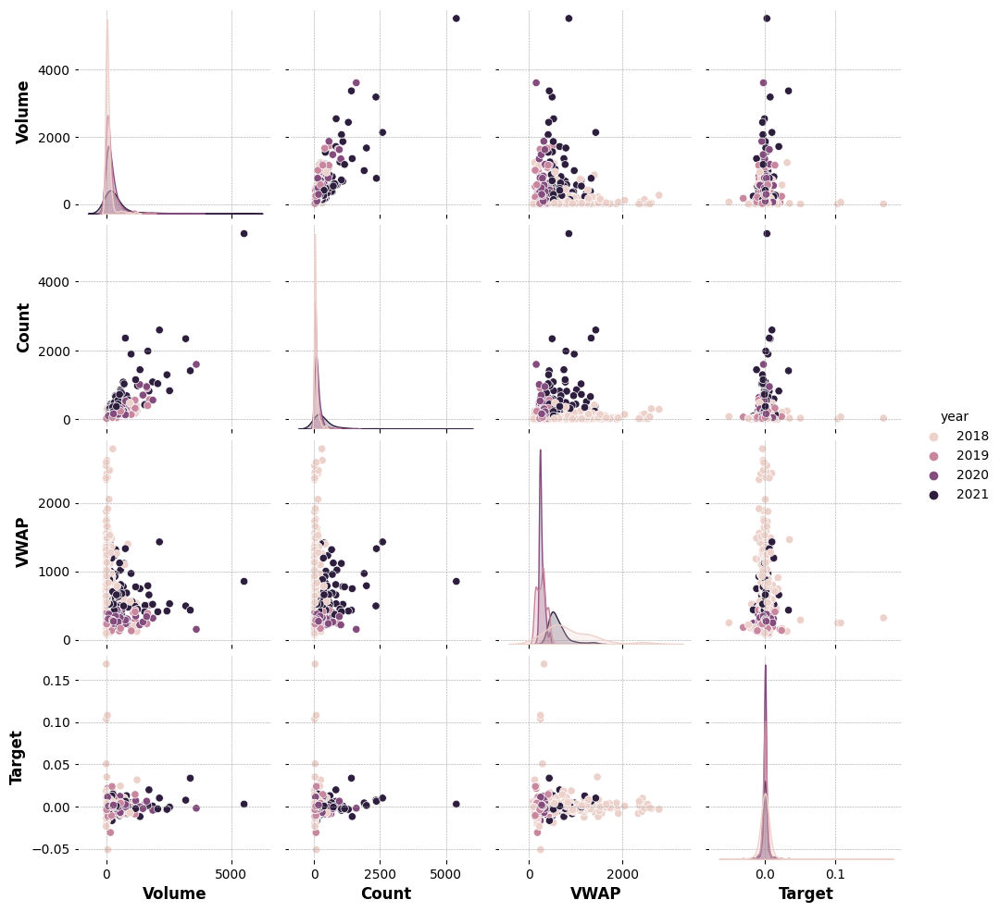

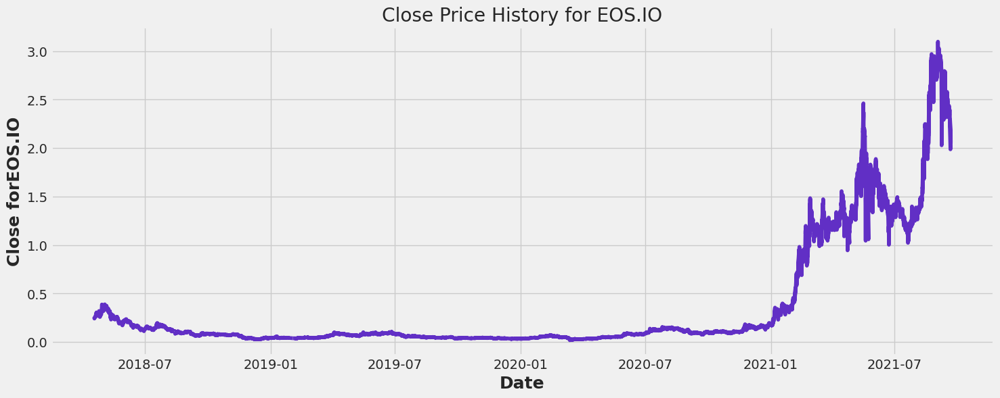

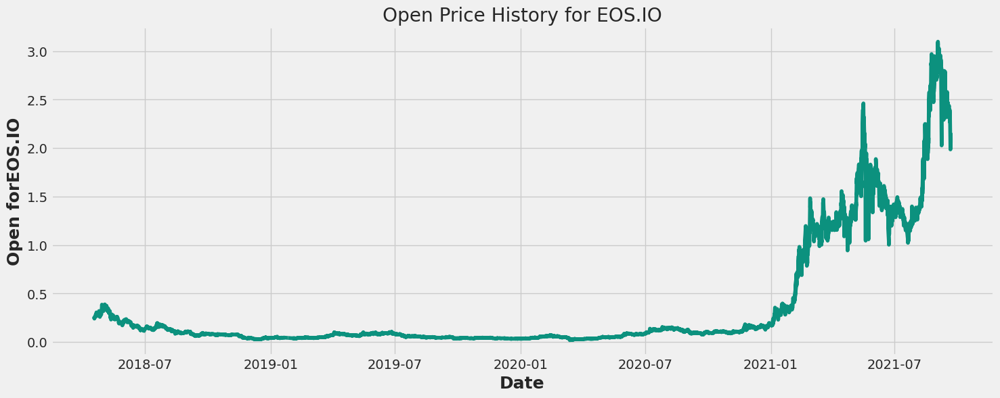

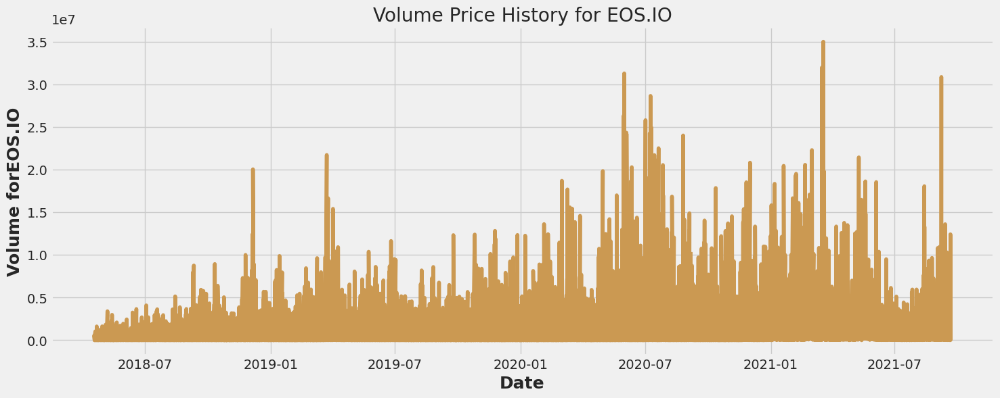

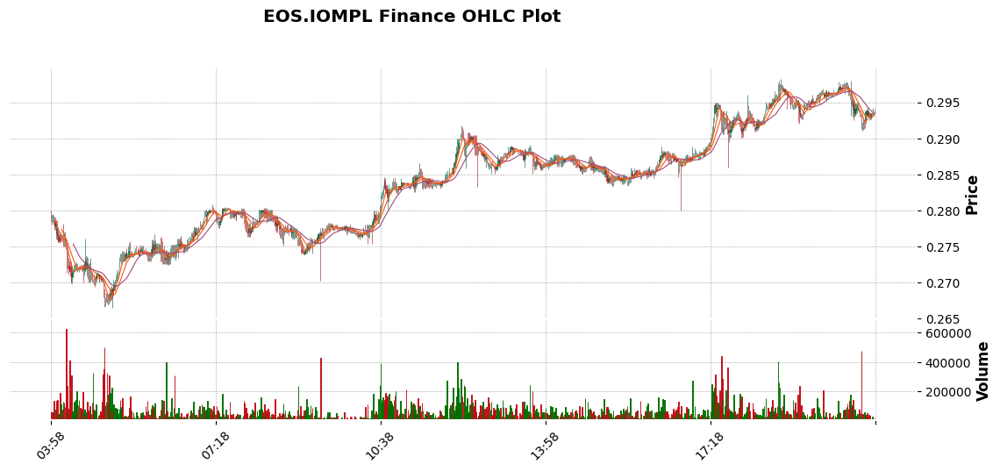

Ethereum Classic


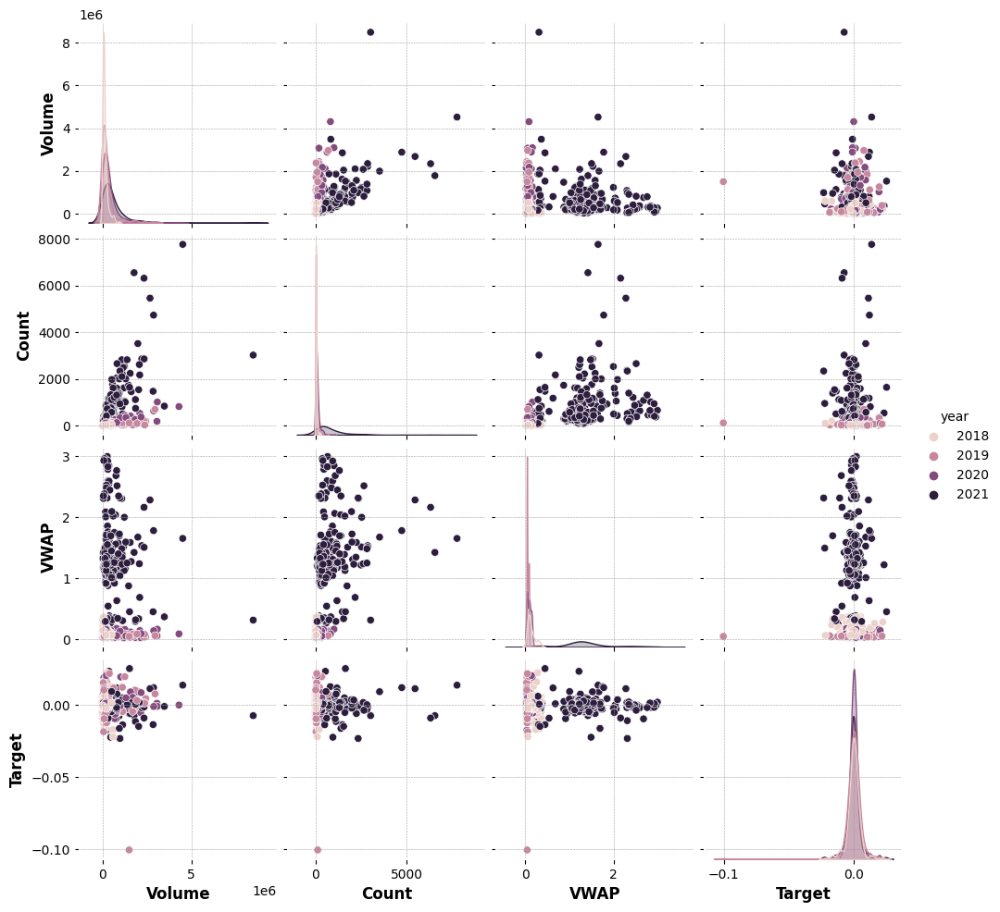

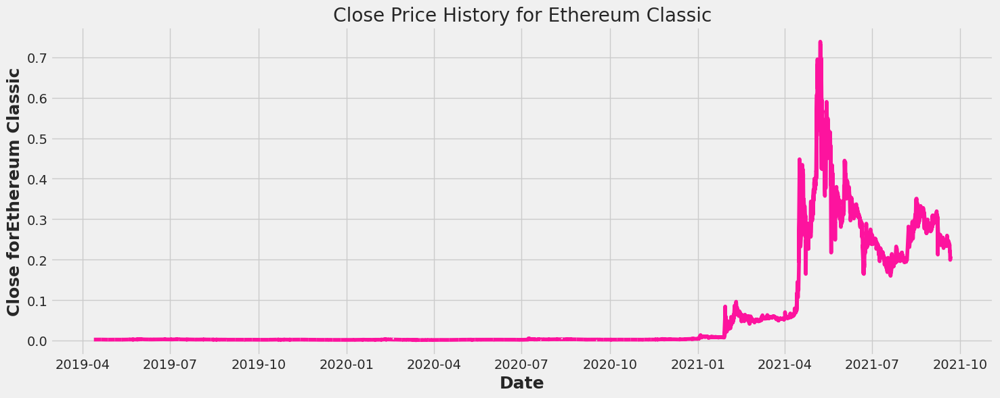

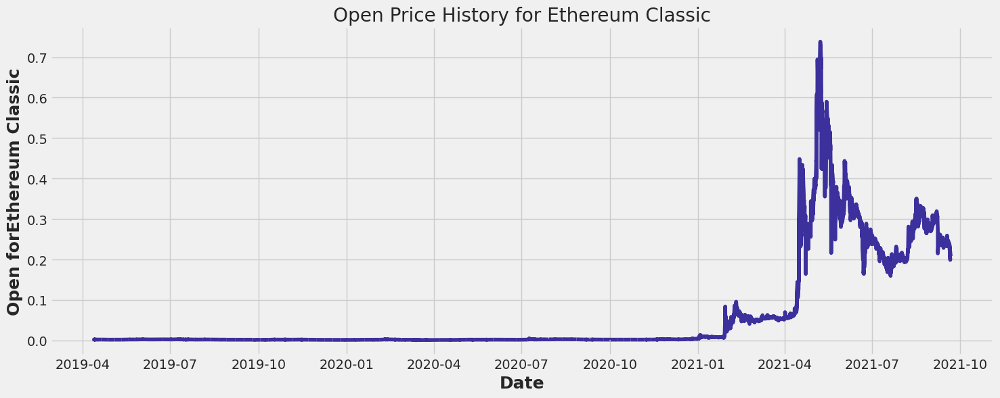

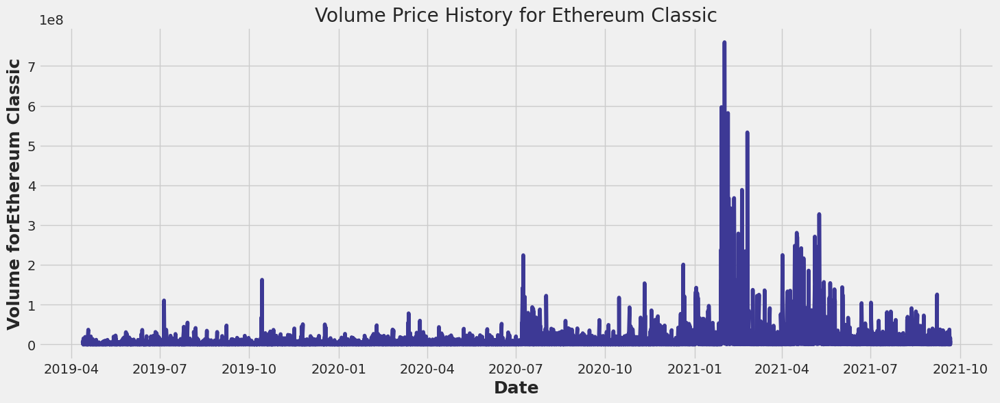

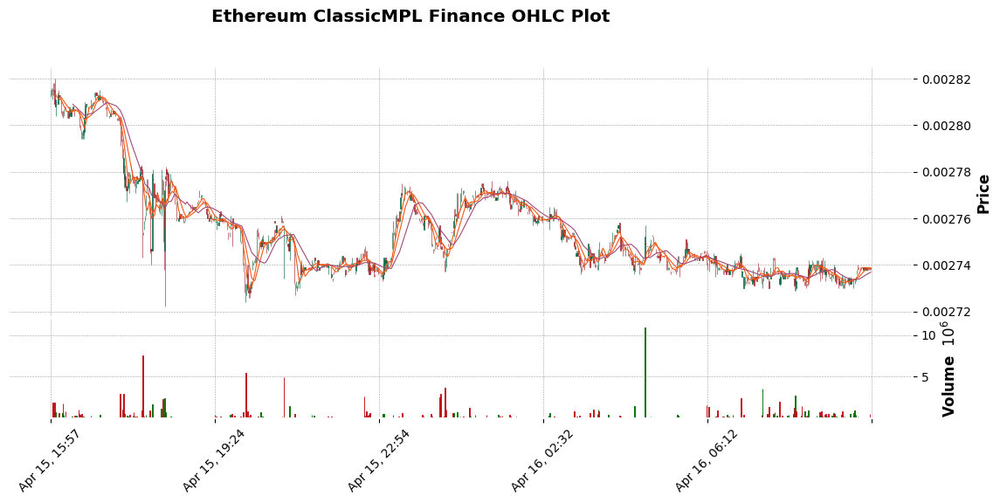

Ethereum


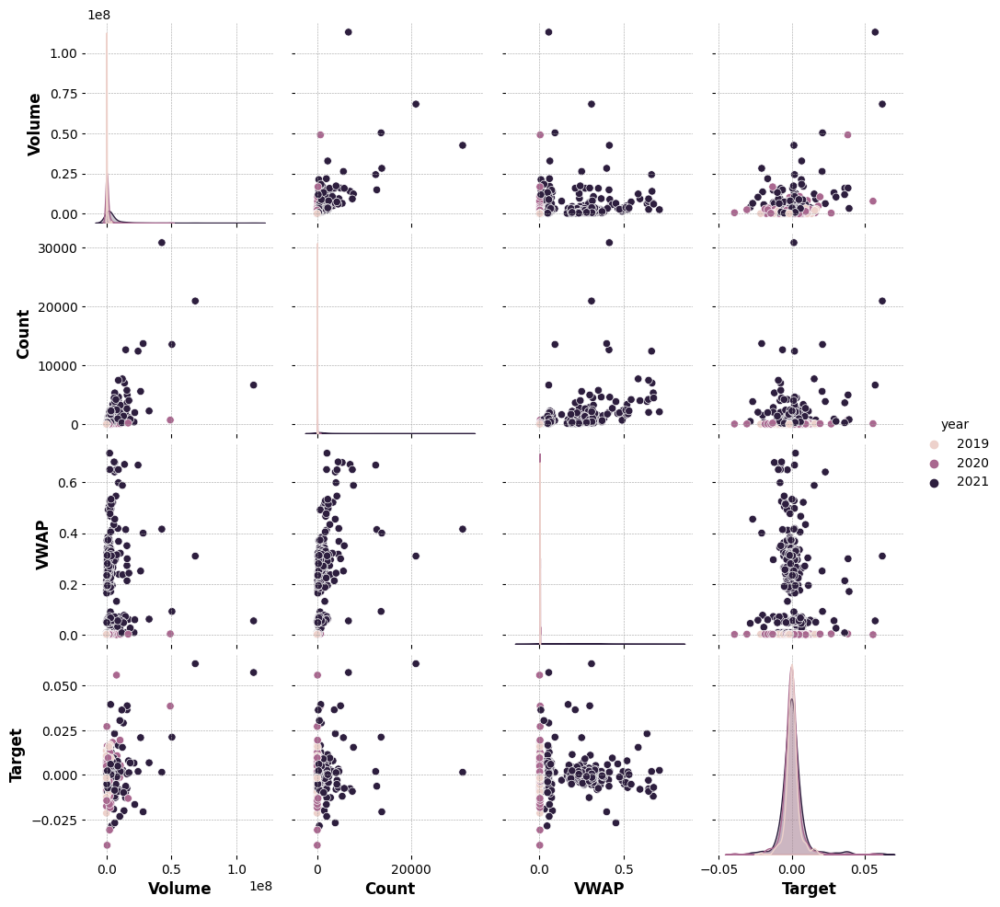

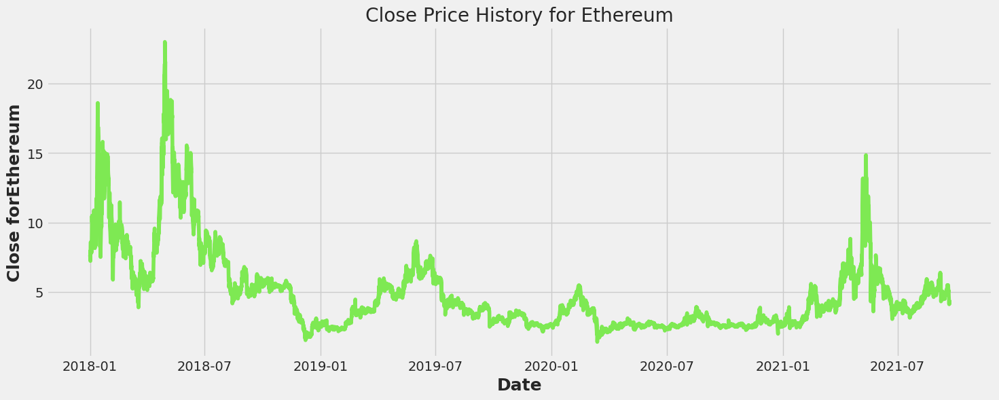

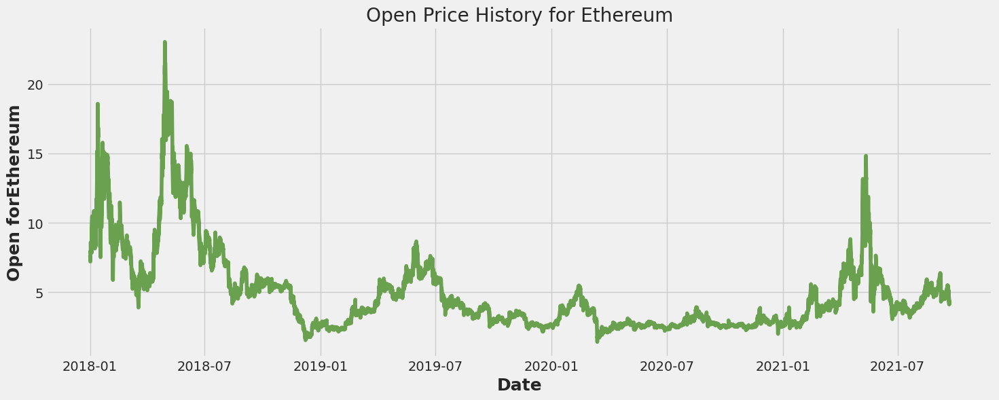

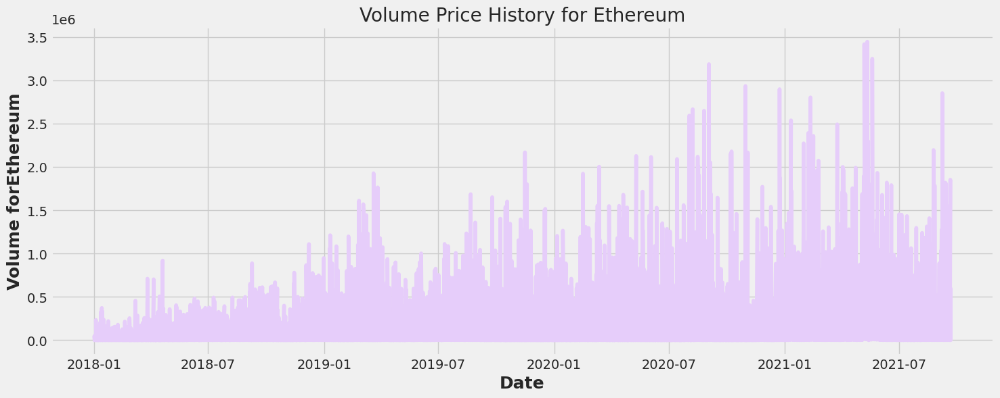

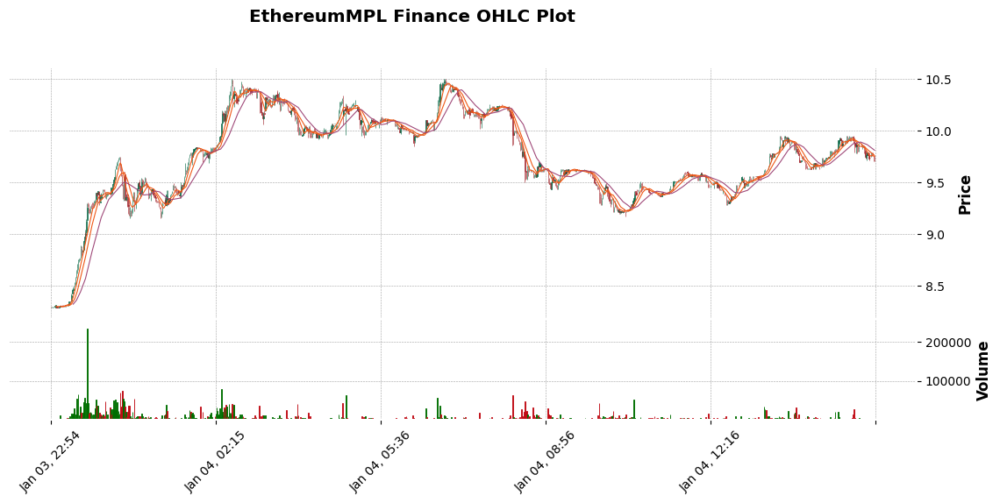

Litecoin


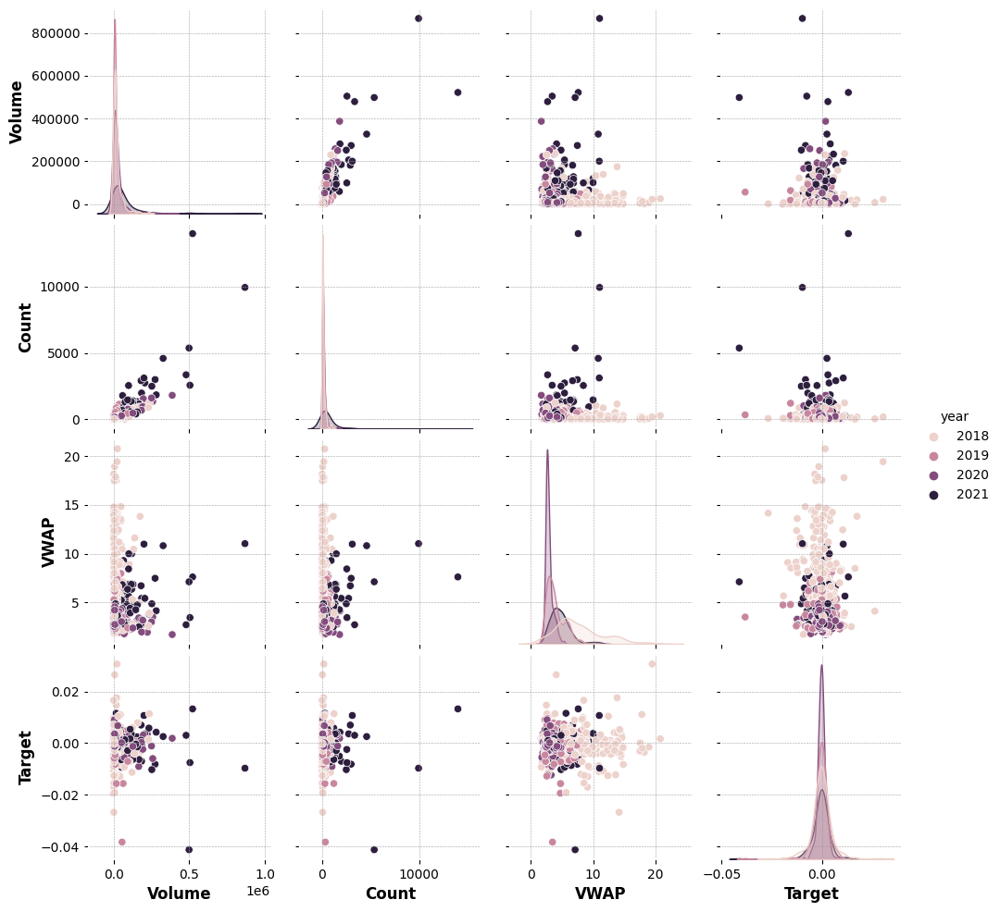

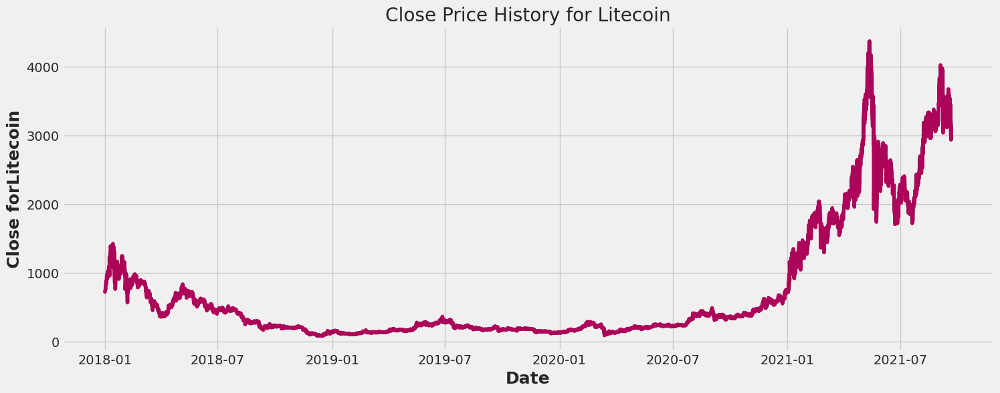

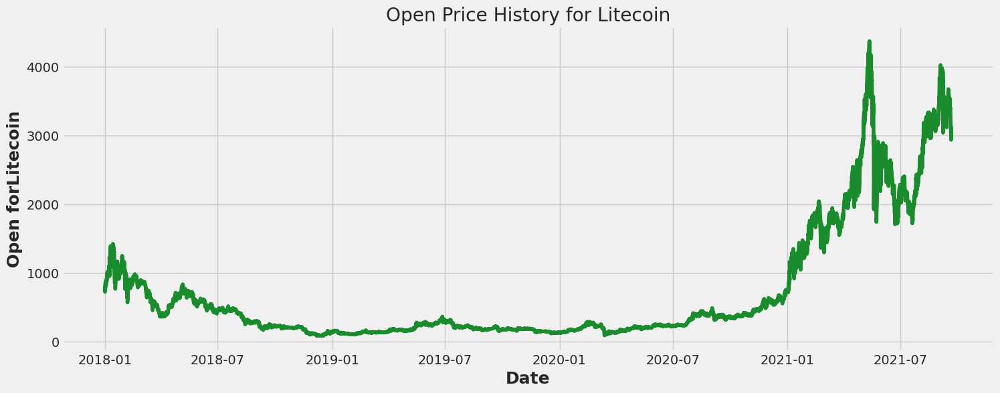

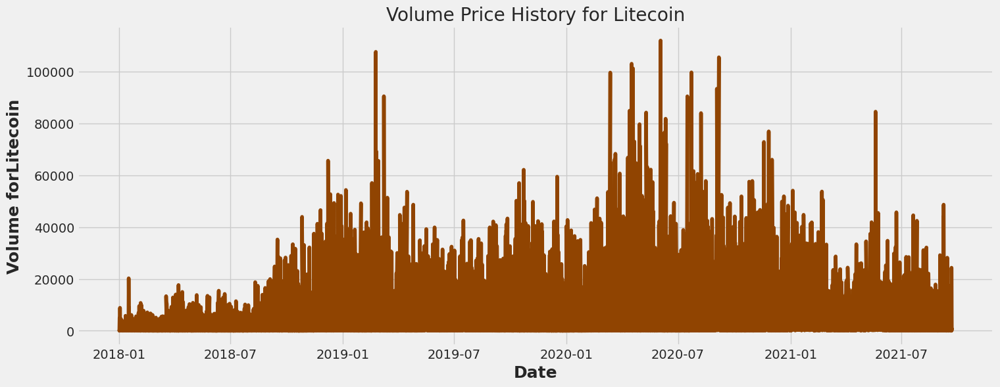

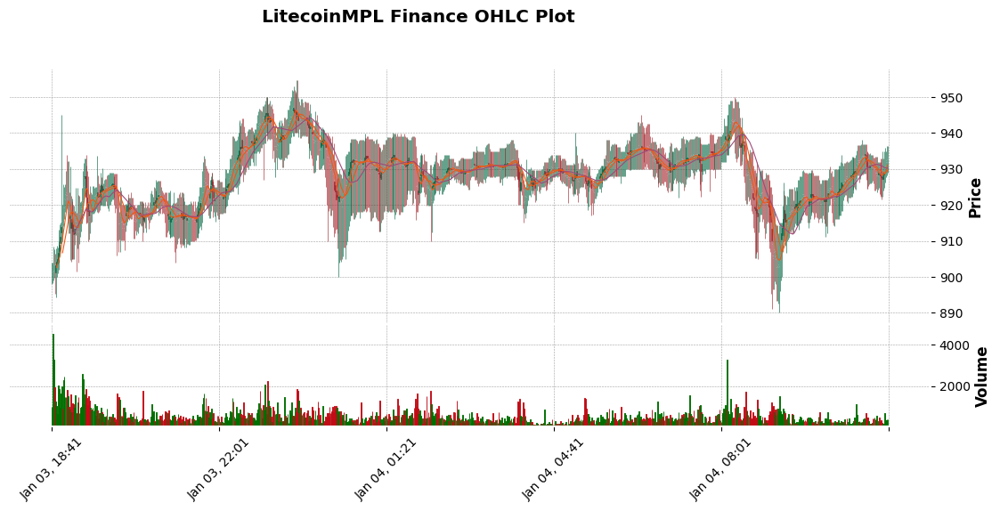

Monero


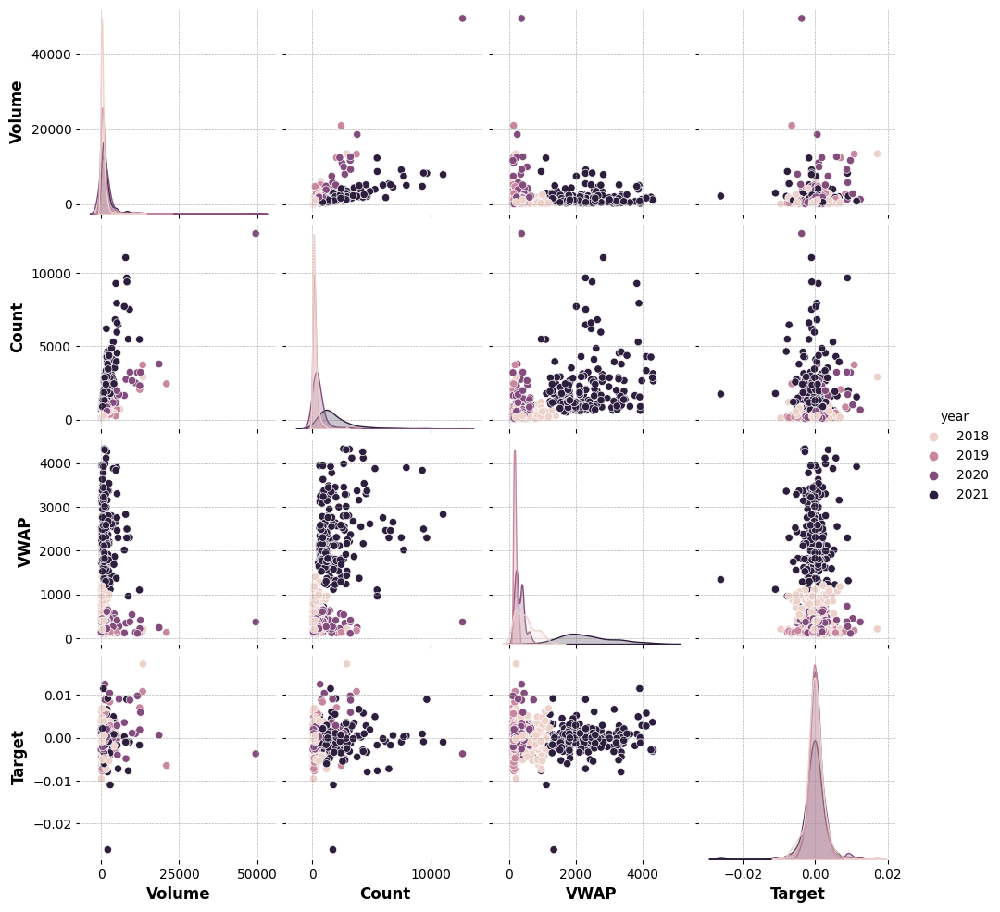

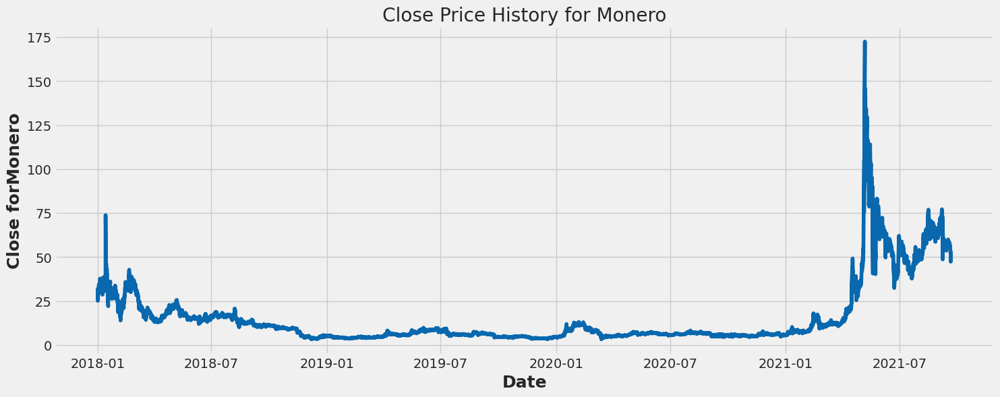

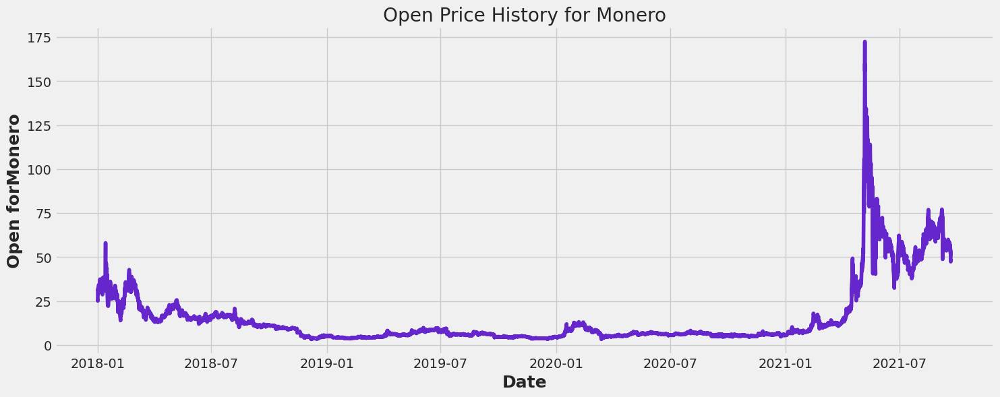

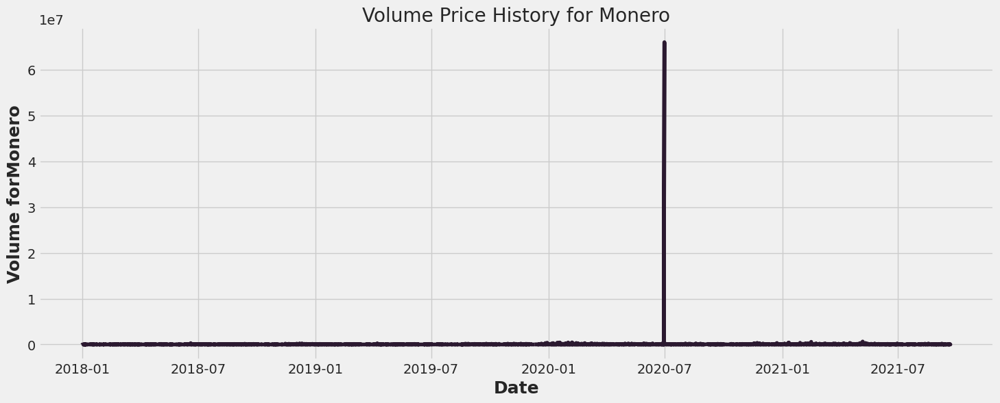

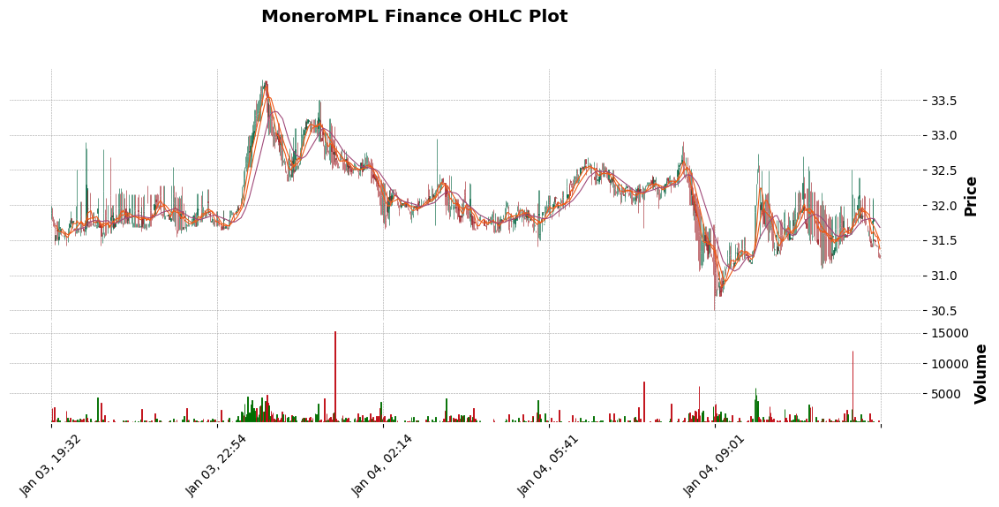

TRON


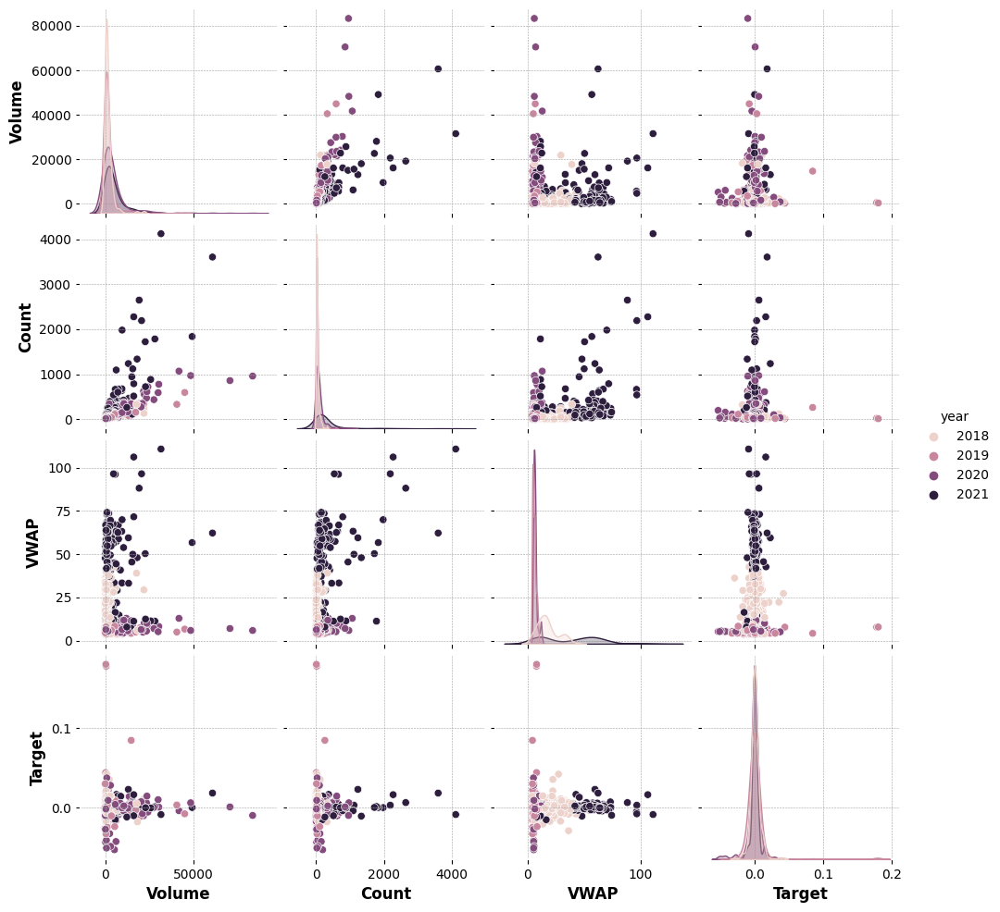

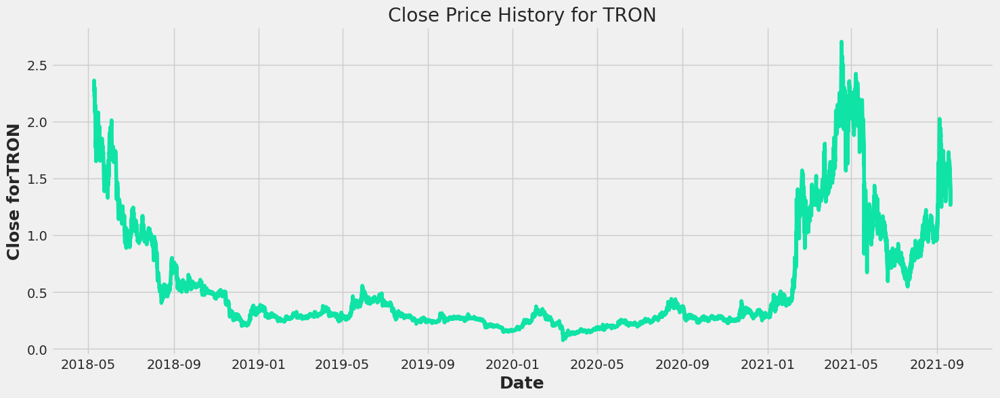

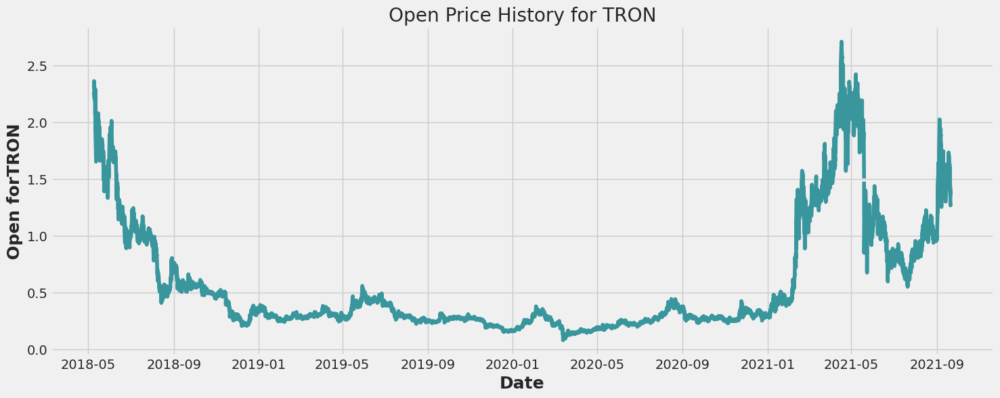

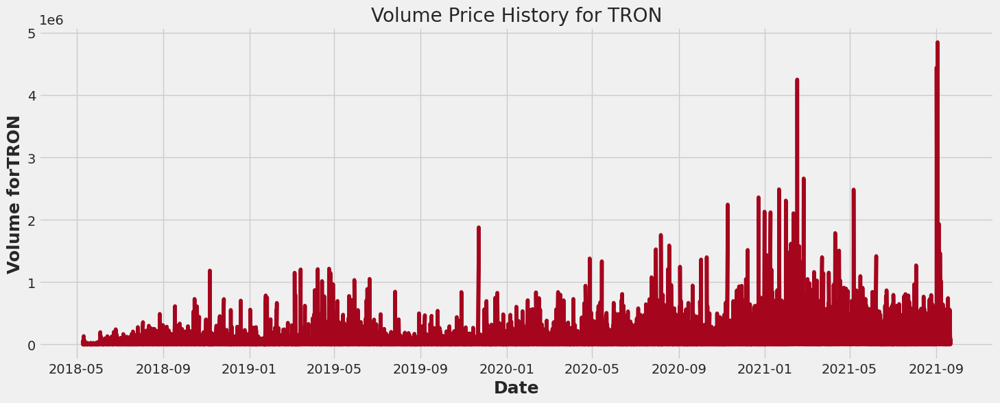

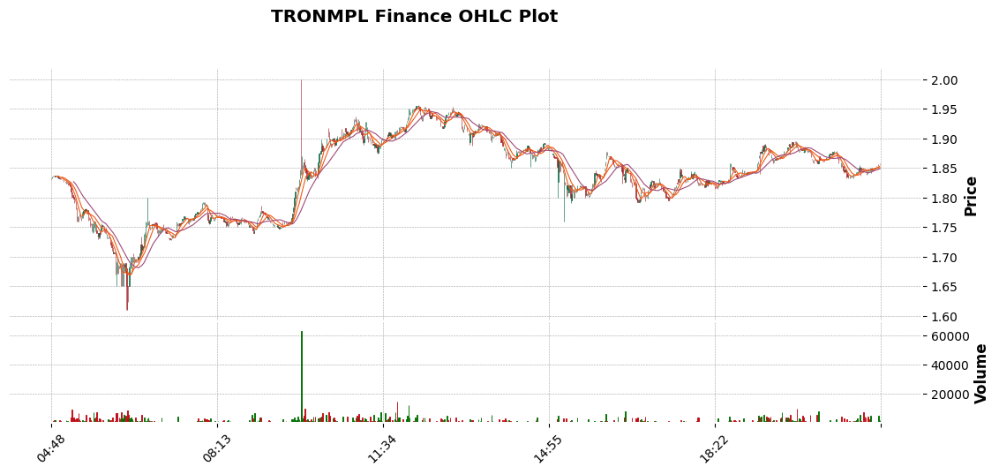

Stellar


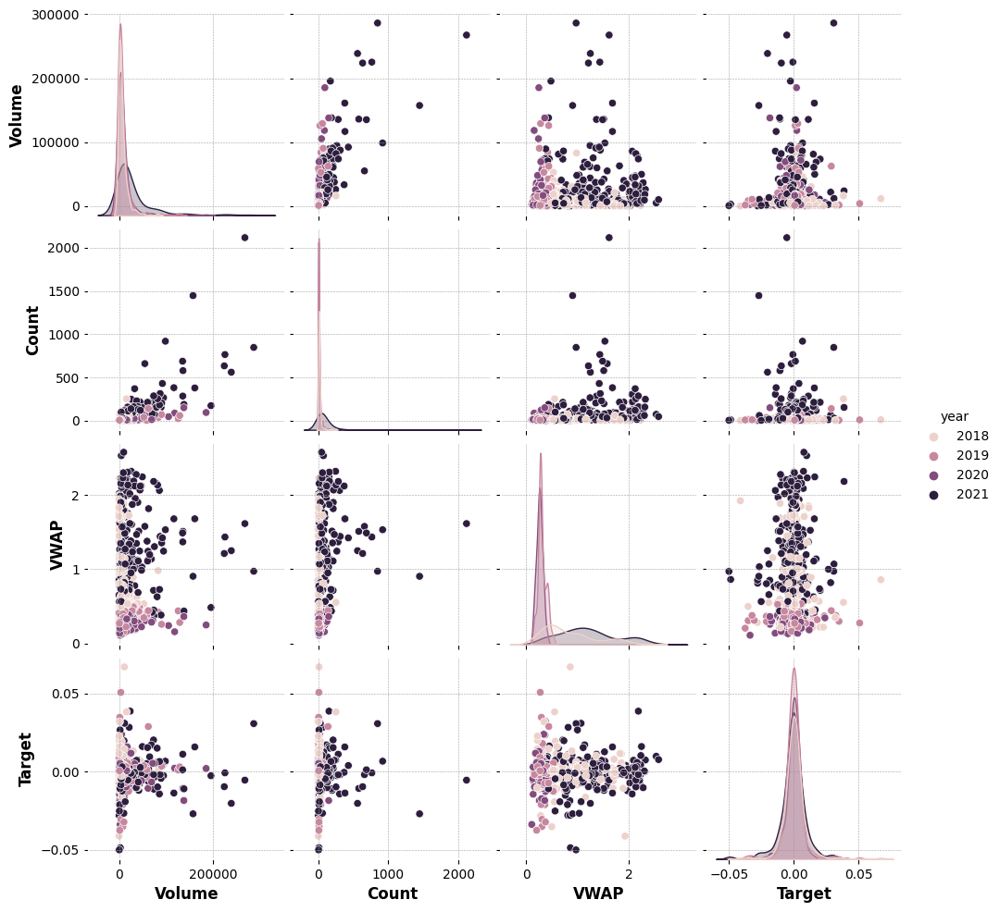

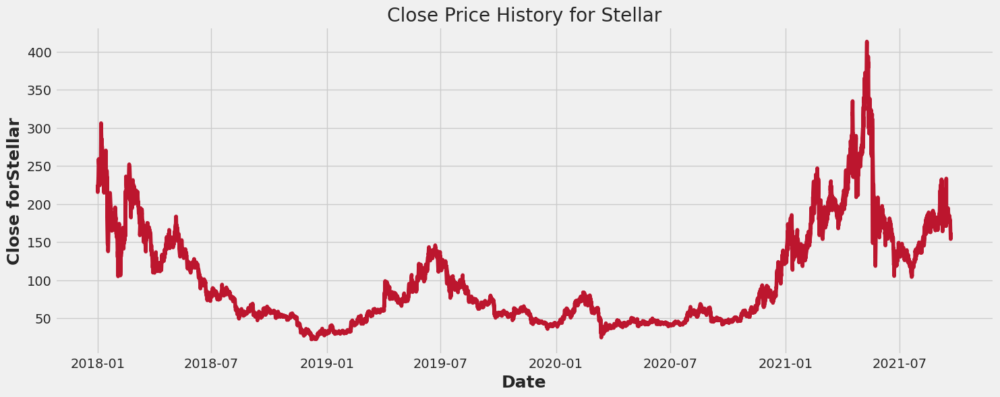

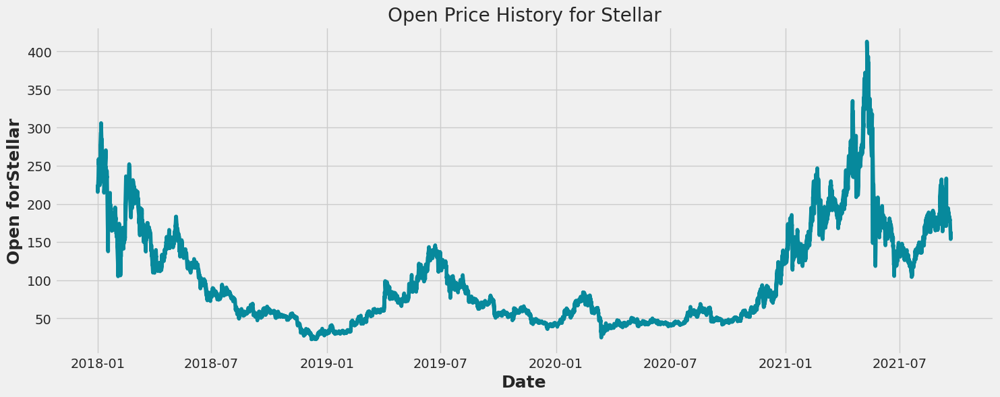

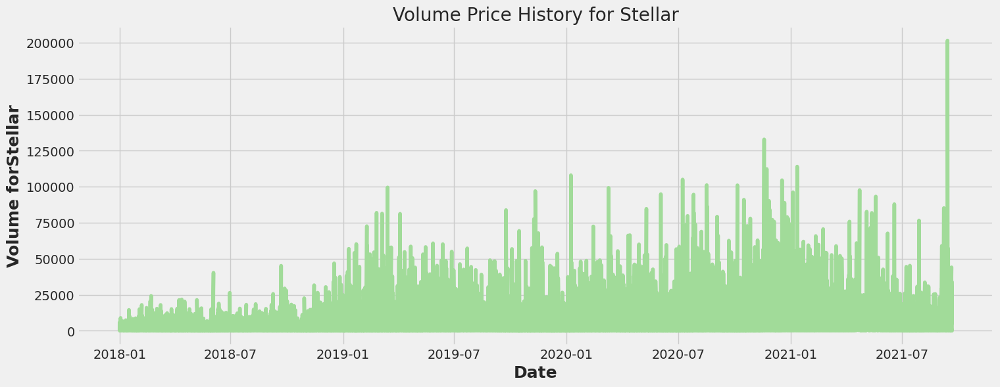

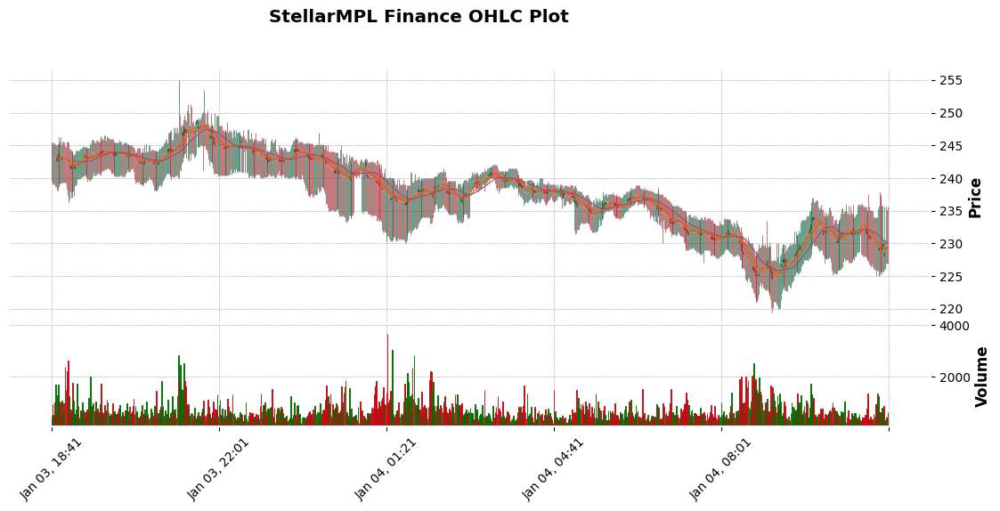

Cardano


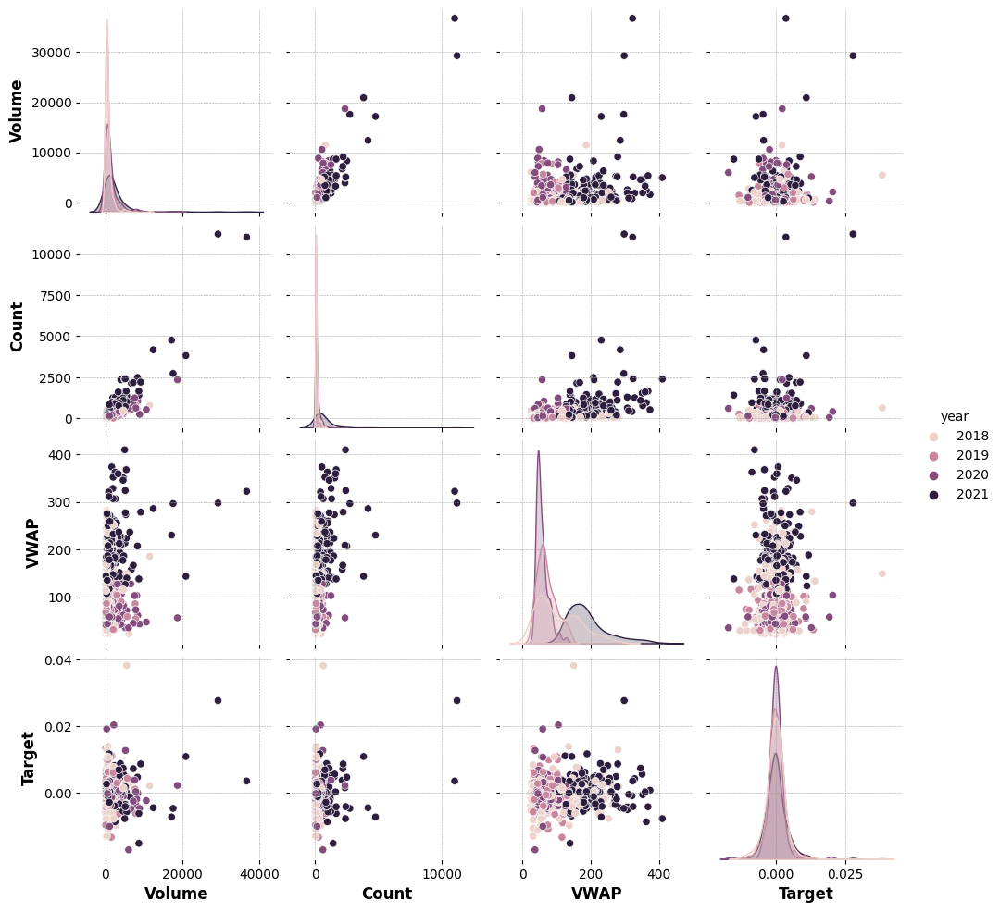

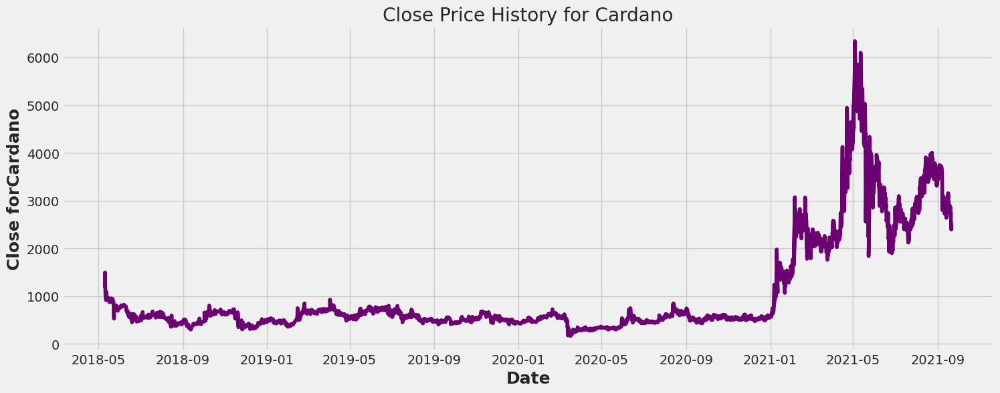

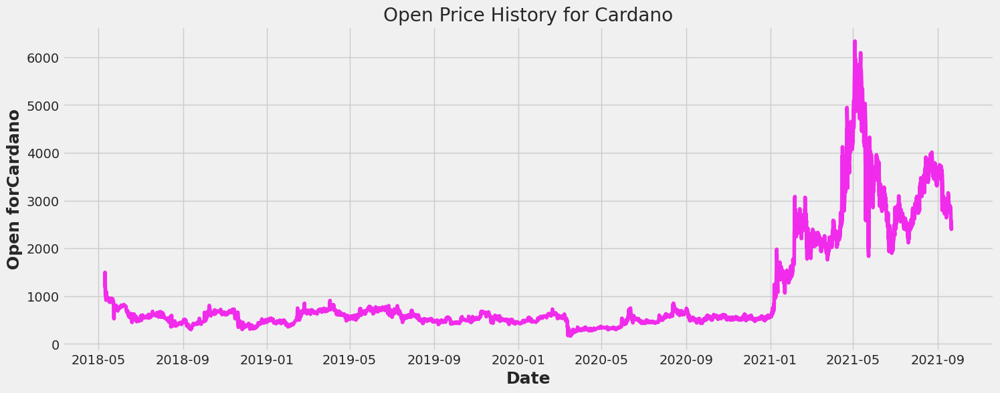

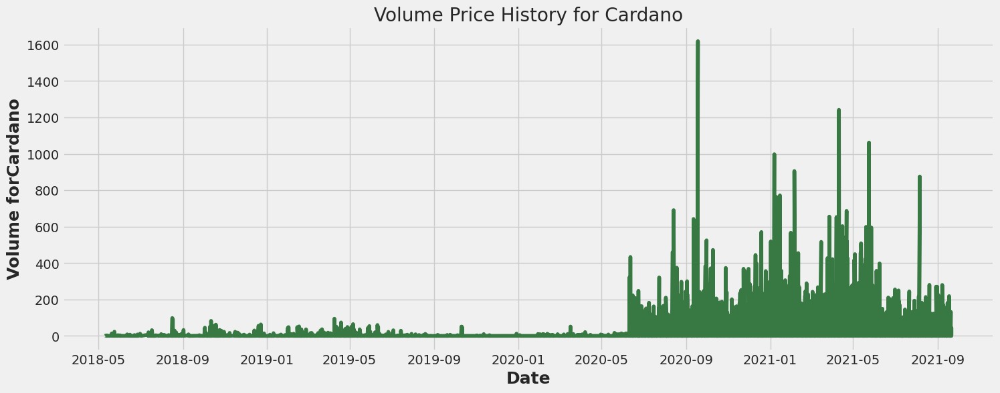

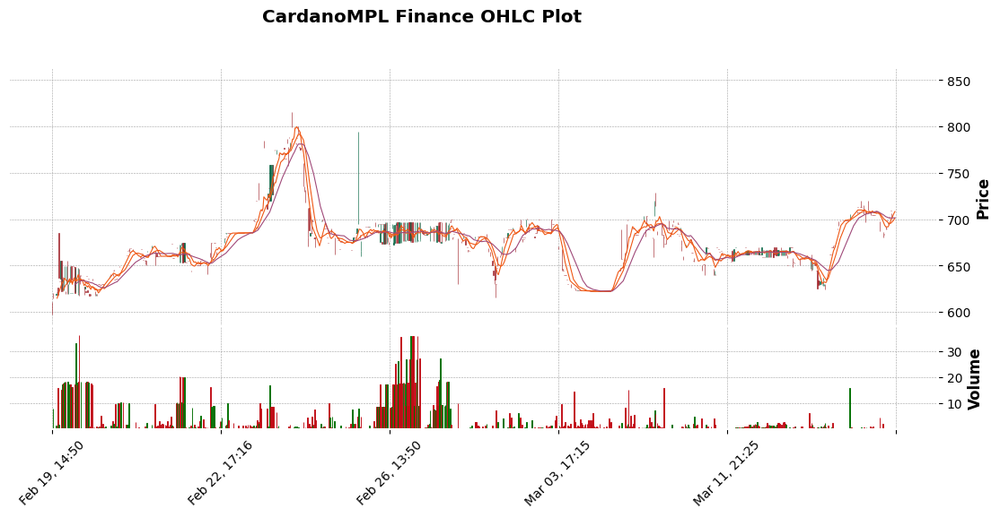

IOTA


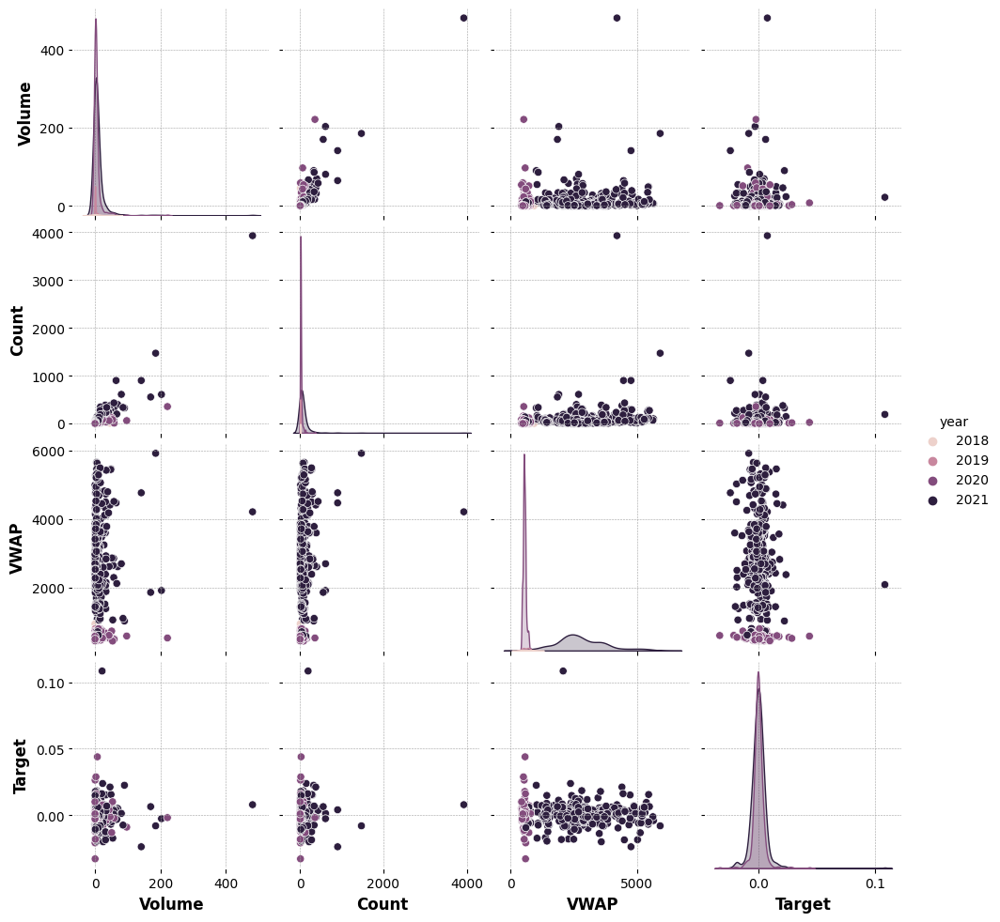

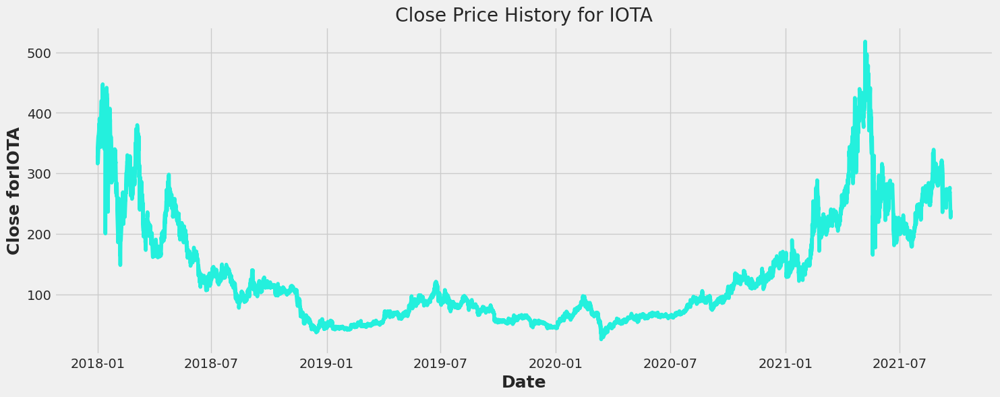

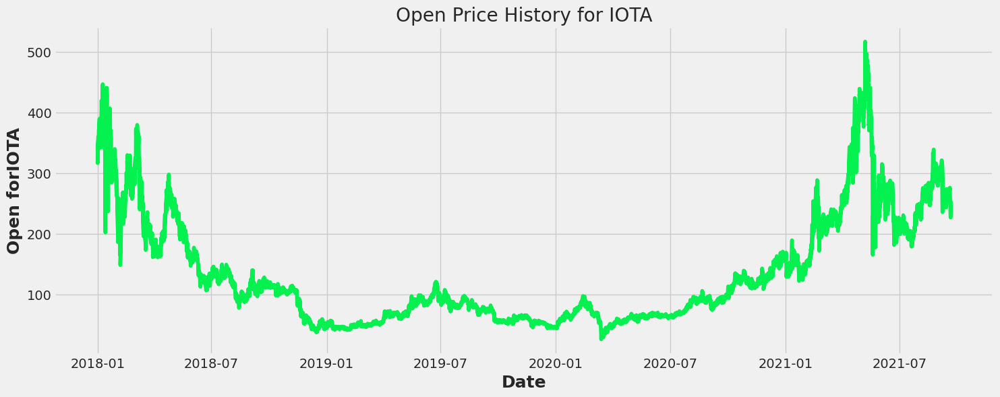

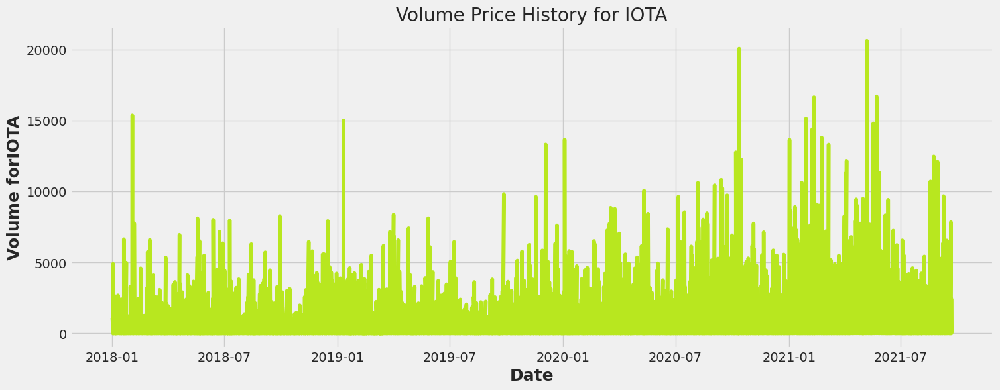

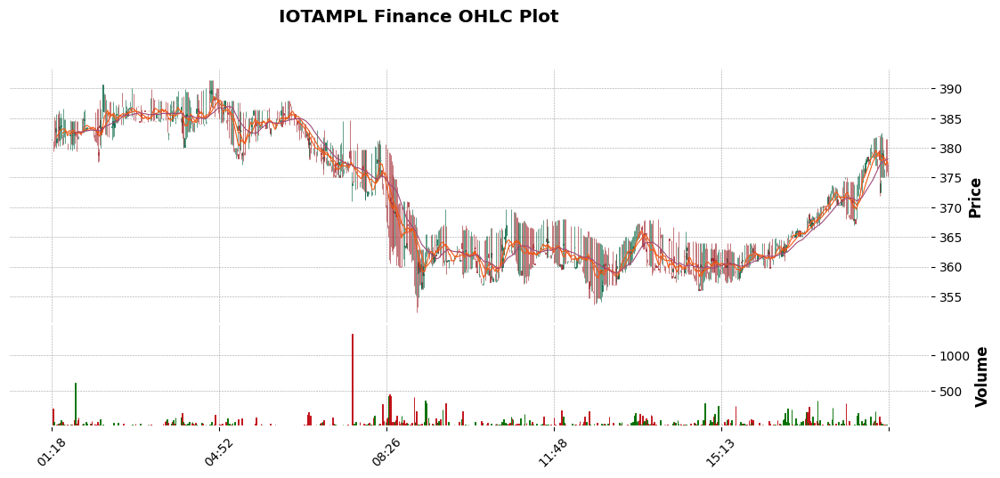

Maker


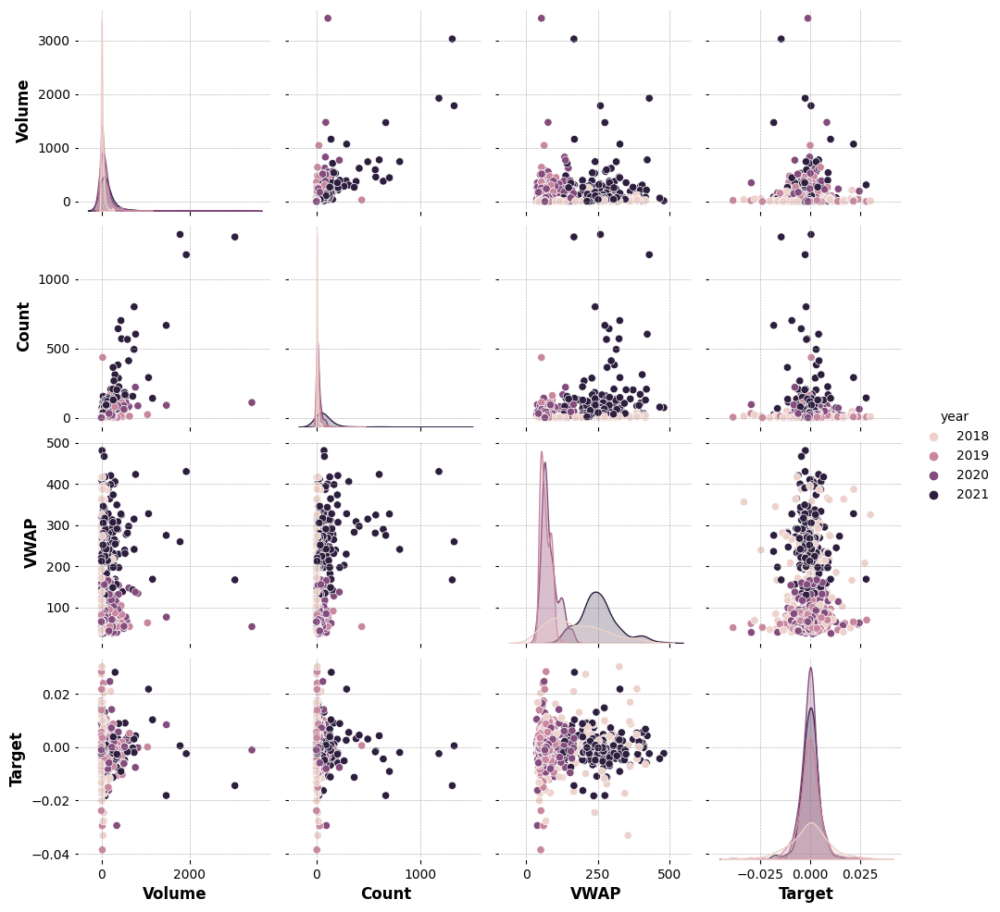

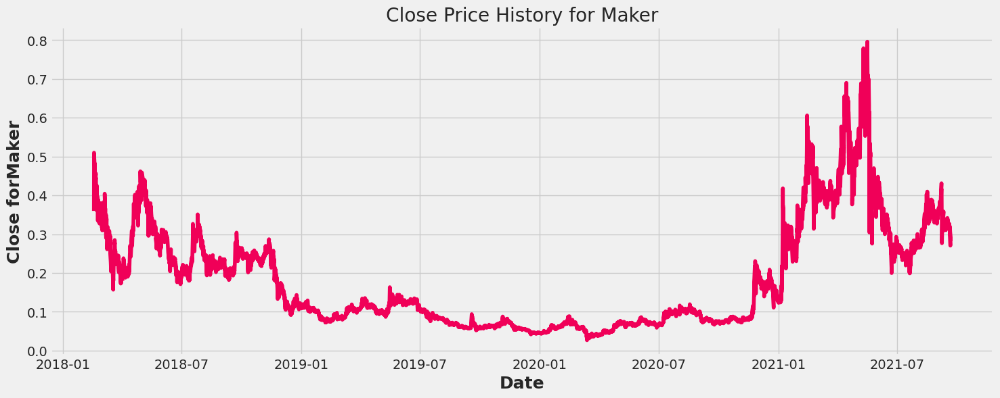

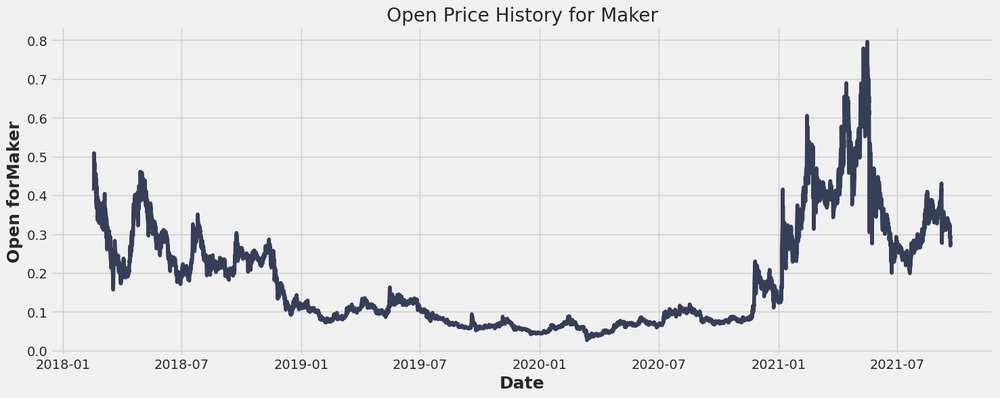

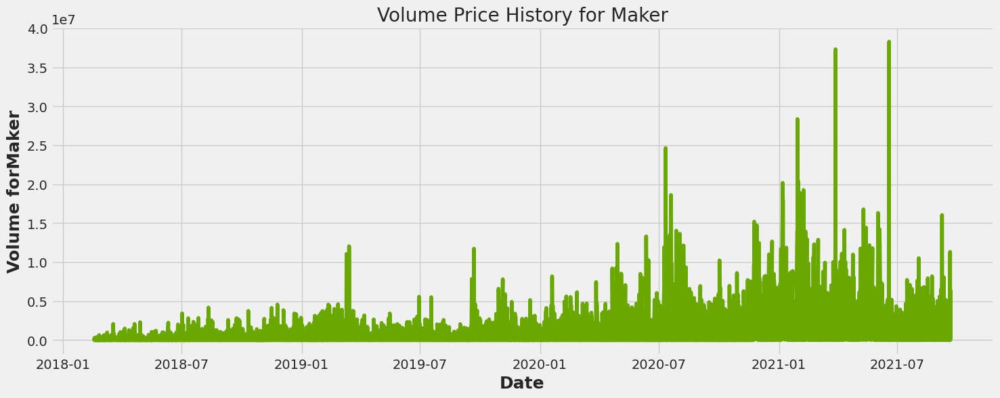

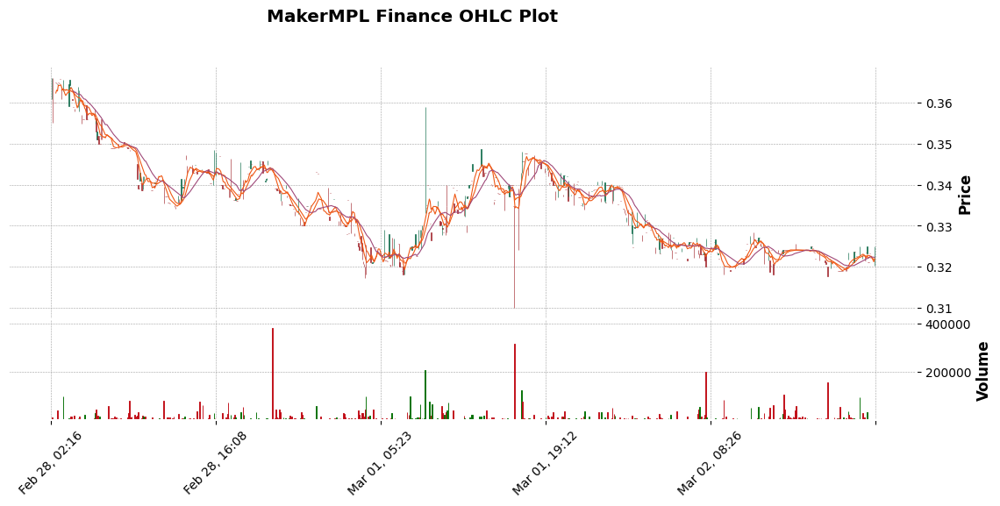

Dogecoin


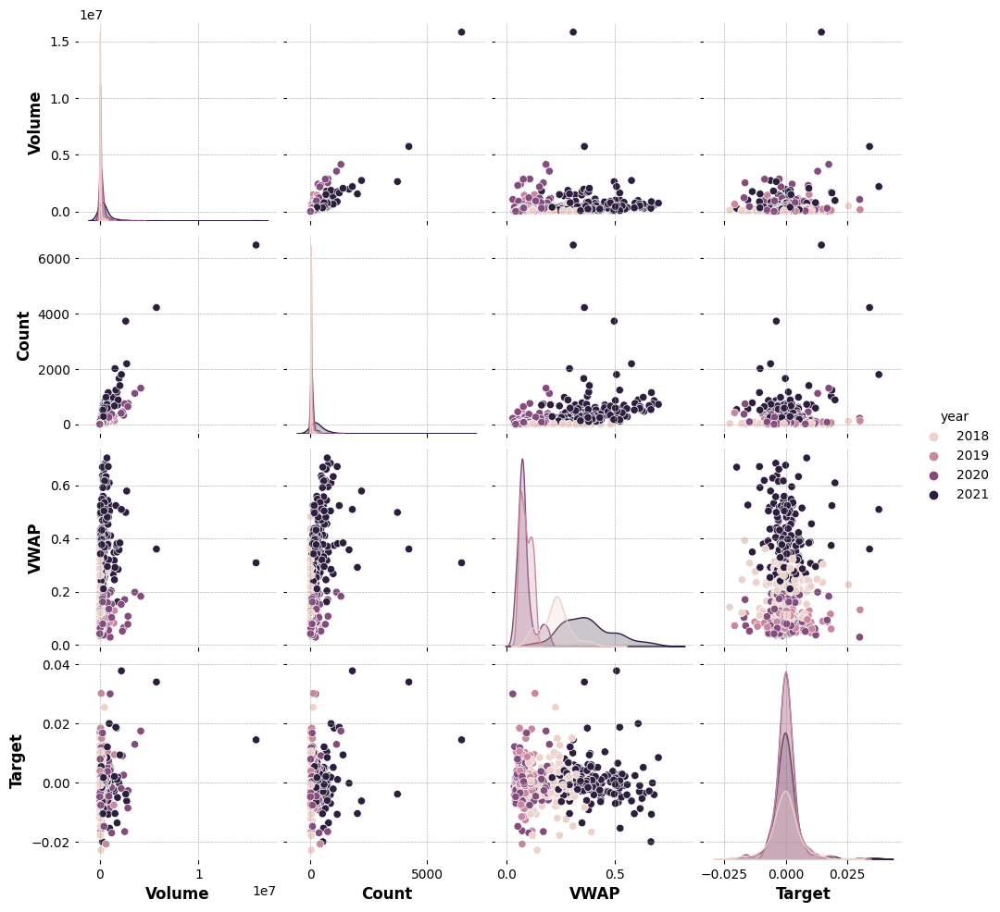

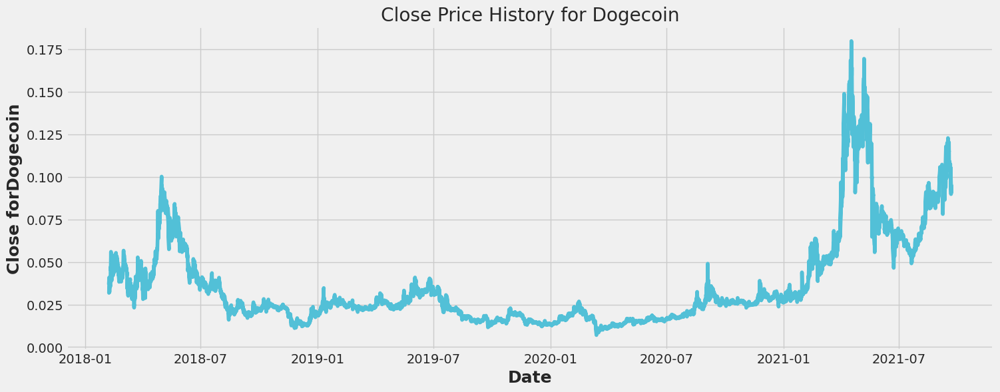

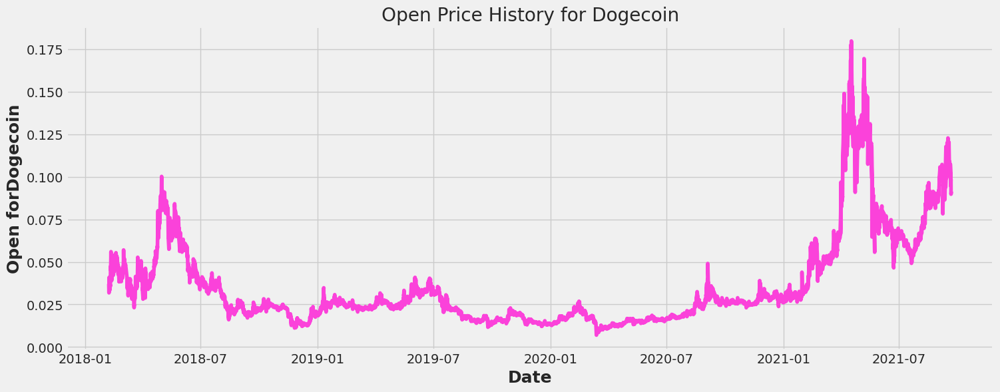

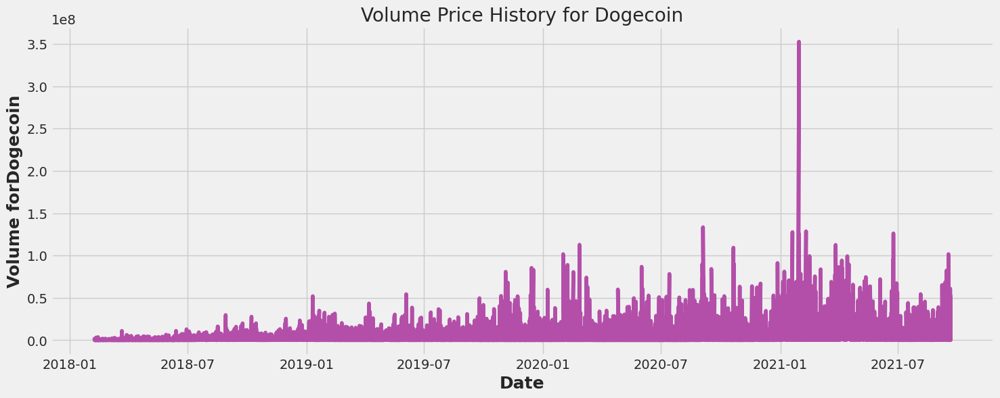

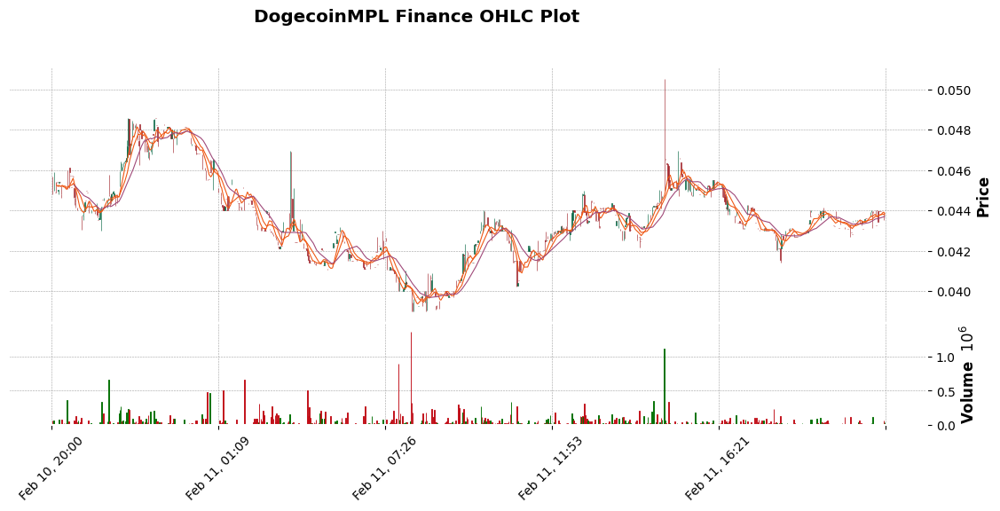

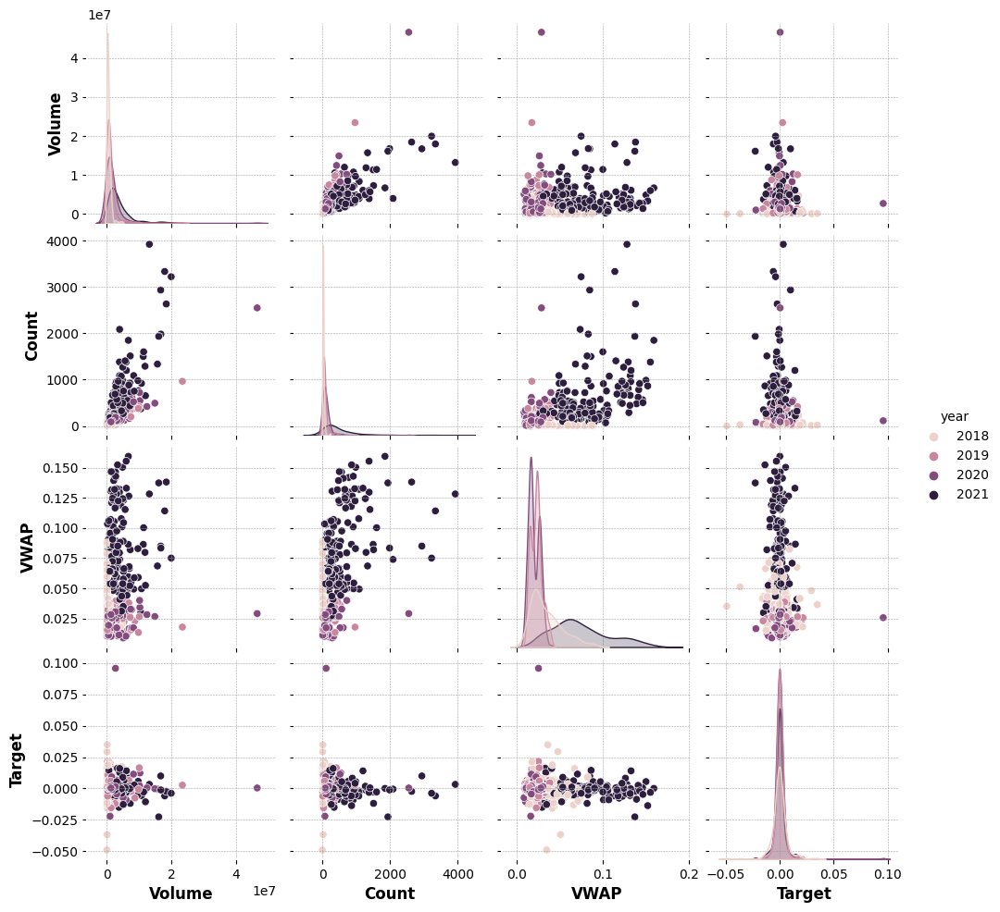

In [13]:
asset_names = asset_details.Asset_Name.unique()
for i in range(0,14):
    subsett = crypto_df_subset(i, crypto_df)
    subsett['Date'] = pd.to_datetime(subsett.Date, utc=False)
    subsett.index = pd.DatetimeIndex(subsett['Date'])
    #assetname = asset_details.Asset_Name[asset_details.Asset_ID == i]
    print(asset_names[i])
    plot_close_val(subsett, 'Close',asset_names[i])
    plot_close_val(subsett, 'Open',asset_names[i])
    plot_close_val(subsett, 'Volume',asset_names[i])
    # Try an MPLPlot for the 4000-5000 Data point range
    mplplot(subsett[4000:5000], asset_names[i])
    subsett=subsett.sample(1_000, random_state=529)
    sn_pairplot(subsett)
    del subsett
    

# 4. Basic Asset Info

In [14]:
asset_count= []
for i in range(14):
    count = (crypto_df["Asset_ID"]==i).sum()
    asset_count.append(count)


In [15]:
asset_map = asset_details.set_index('Asset_ID')['Asset_Name'].to_dict()
crypto_df['Asset_Name'] = crypto_df['Asset_ID'].map(asset_map)


In [16]:
import plotly.express as px
import plotly.graph_objects as go

fig = px.bar(y = asset_details.sort_values("Asset_ID")["Asset_Name"],
             x = asset_count , 
             color = asset_count ,
             color_continuous_scale="Spectral") 
fig.update_yaxes(title="Assets")
fig.update_xaxes(title = "Number of Entries")
fig.update_layout(showlegend = True,
    title = {
        'text': 'Asset Data Distribution ',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

In [17]:
asset_details["Weight_Percentage"] = (asset_details["Weight"] / asset_details["Weight"].sum()) * 100
asset_details.sort_values("Weight", ascending=False).style.background_gradient(cmap='gist_rainbow_r')

,Asset_ID,Weight,Asset_Name,Weight_Percentage
2,1,6.779922,Bitcoin,16.584998
5,6,5.894403,Ethereum,14.418848
10,3,4.406719,Cardano,10.779686
1,0,4.304065,Binance Coin,10.528574
13,4,3.555348,Dogecoin,8.697068
0,2,2.397895,Bitcoin Cash,5.865715
6,9,2.397895,Litecoin,5.865715
4,7,2.079442,Ethereum Classic,5.086716
9,12,2.079442,Stellar,5.086716
8,13,1.791759,TRON,4.382990


In [18]:

fig = px.pie(asset_details, values='Weight_Percentage', names='Asset_Name', title='Cryptocurrency Asset Weightage')
fig.show()

In [19]:
btc = crypto_df_subset(0, crypto_df)
#subest first 10000 rows
btc=btc[:10000]
btc.shape
btc['Date']=btc['Date'].astype('datetime64[s]')

## Some VWAP Violin Chart

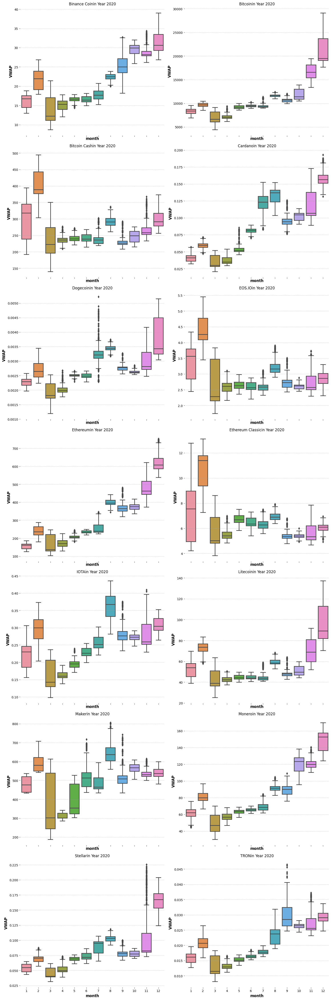

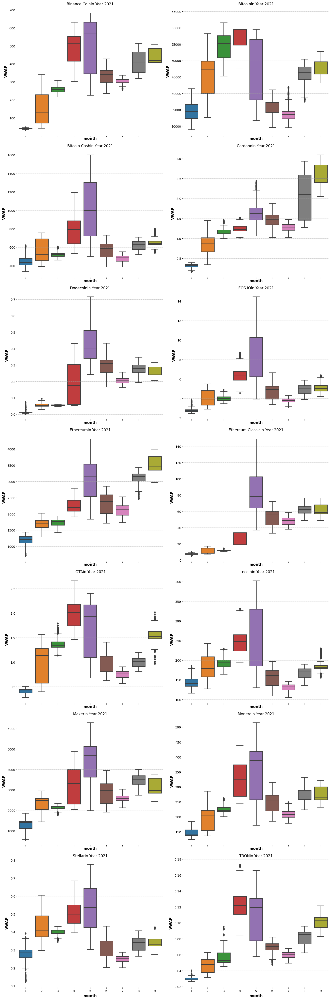

In [20]:
#VWAP Plot
fig, axs = plt.subplots(7, 2,
                        figsize=(15, 45), sharex=True)
axs = axs.flatten()
i = 0
for asn, d in crypto_df.query('year == 2020').sample(1_000_00, random_state=529).groupby('Asset_Name'):
    sns.boxplot(data=d, x='month', y='VWAP', ax=axs[i])
    axs[i].set_title(asn + 'in Year 2020')
    i += 1
plt.tight_layout()
plt.show()

#VWAP Plot
fig, axs = plt.subplots(7, 2,
                        figsize=(15, 45), sharex=True)
axs = axs.flatten()
i = 0
for asn, d in crypto_df.query('year == 2021').sample(1_000_00, random_state=529).groupby('Asset_Name'):
    sns.boxplot(data=d, x='month', y='VWAP', ax=axs[i])
    axs[i].set_title(asn + 'in Year 2021')
    i += 1
plt.tight_layout()
plt.show()

# 5. Basic Rolling Averages

## 5.1 Basic Rolling Averages

In [21]:
# Isolate the adjusted closing prices 
adj_close_px = btc['Close']

# Calculate the moving average
moving_avg = adj_close_px.rolling(window=40).mean()

# Inspect the result
moving_avg[-10:]

80177    18.367775
80185    18.362277
80193    18.354105
80201    18.348562
80209    18.340522
80217    18.329560
80225    18.317880
80233    18.305642
80241    18.292848
80249    18.278360
Name: Close, dtype: float64

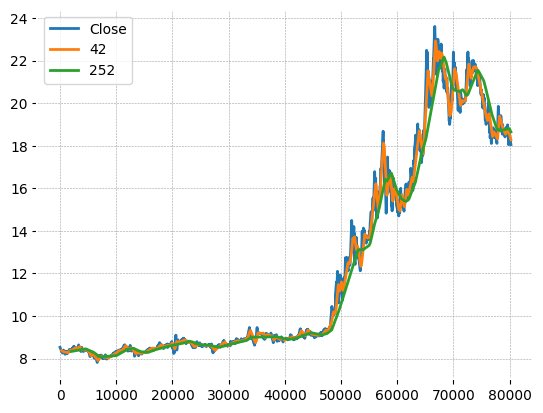

In [22]:
# Short moving window rolling mean
btc['42'] = adj_close_px.rolling(window=40).mean()

# Long moving window rolling mean
btc['252'] = adj_close_px.rolling(window=252).mean()

# Plot the adjusted closing price, the short and long windows of rolling means
btc[['Close', '42', '252']].plot()

plt.show()

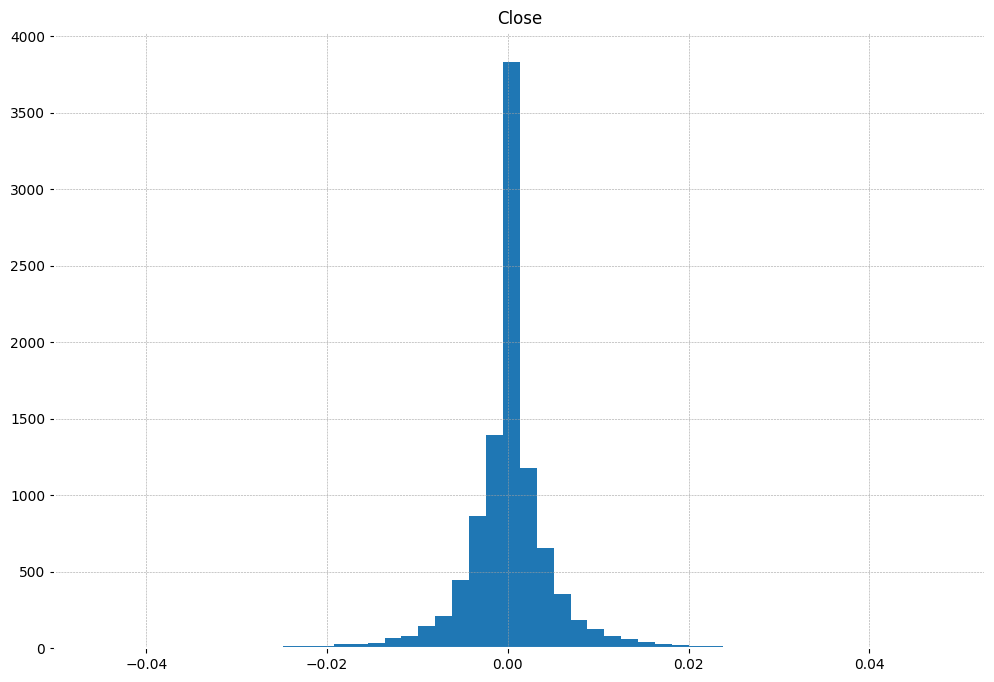

In [23]:
daily_close_px = btc[['Close']]
# Calculate the daily percentage change for `daily_close_px`
daily_pct_change = daily_close_px.pct_change()

# Plot the distributions
daily_pct_change.hist(bins=50, sharex=True, figsize=(12,8))

# Show the resulting plot
plt.show()

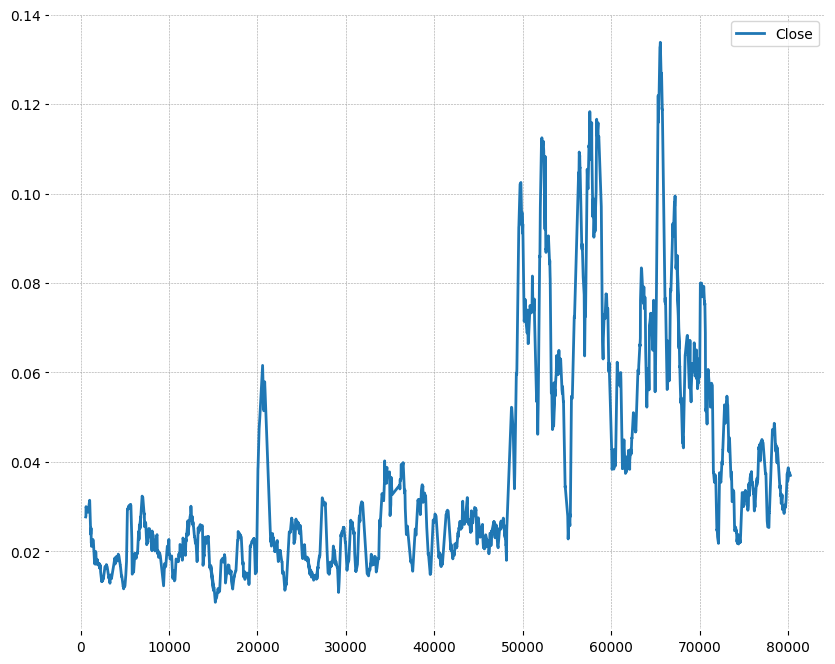

In [24]:
# Define the minumum of periods to consider 
min_periods = 75 

# Calculate the volatility
vol = daily_pct_change.rolling(min_periods).std() * np.sqrt(min_periods) 

# Plot the volatility
vol.plot(figsize=(10, 8))

# Show the plot
plt.show()

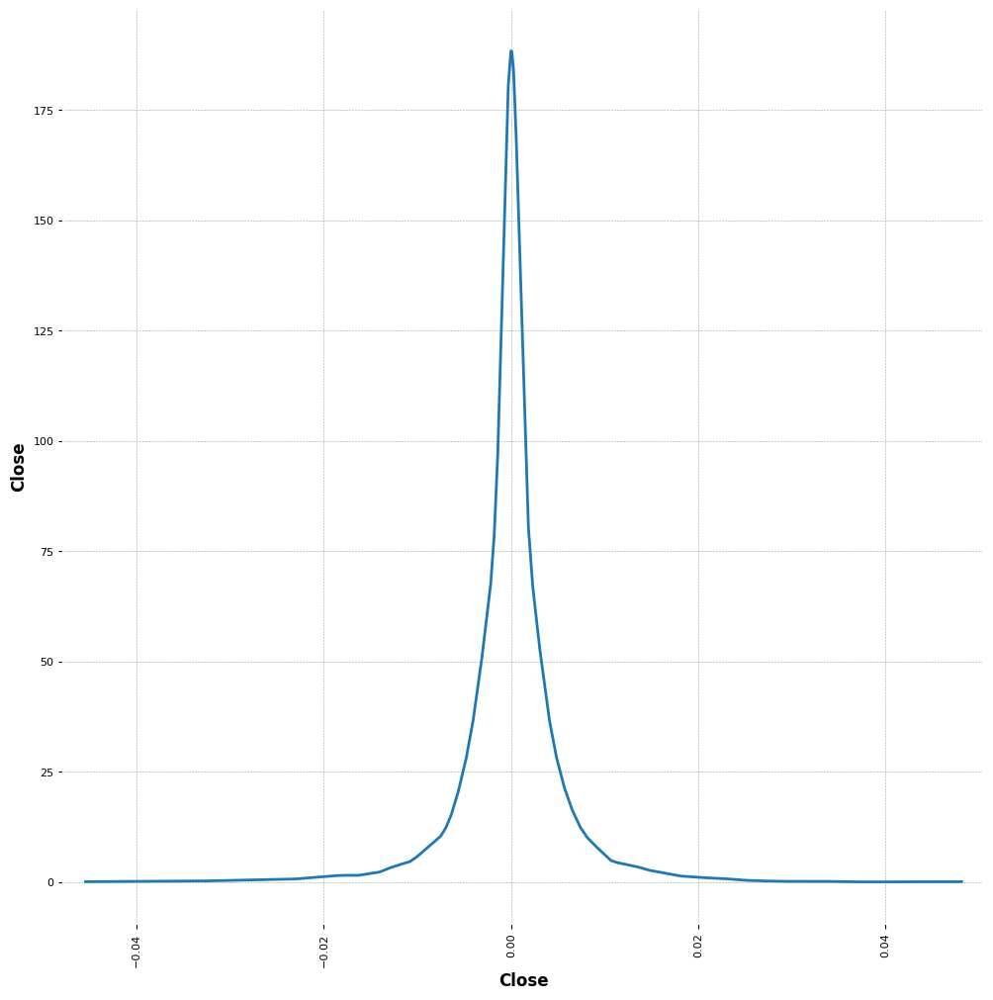

In [25]:
# Plot a scatter matrix with the `daily_pct_change` data 
pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde', alpha=0.1,figsize=(12,12))

# Show the plot
plt.show()

# 6 Basic MACD

In [26]:
import plotly.graph_objects as go

btc=btc.reset_index()

fig = go.Figure(data=go.Ohlc(x=btc['Date'],
        open=btc['Open'],
        high=btc['High'],
        low=btc['Low'],
        close=btc['Close']))
fig.show()

In [27]:
btc=btc.reset_index()

btc['SMA5'] = btc.Close.rolling(5).mean()
btc['SMA20'] = btc.Close.rolling(20).mean()
btc['SMA50'] = btc.Close.rolling(50).mean()
btc['SMA200'] = btc.Close.rolling(200).mean()
btc['SMA500'] = btc.Close.rolling(500).mean()

fig = go.Figure(data=[go.Ohlc(x=btc['Date'],open=btc['Open'],high=btc['High'],low=btc['Low'],close=btc['Close'], name = "OHLC"),
                      go.Scatter(x=btc.Date, y=btc.SMA5, line=dict(color='orange', width=1), name="SMA5"),
                      go.Scatter(x=btc.Date, y=btc.SMA20, line=dict(color='green', width=1), name="SMA20"),
                      go.Scatter(x=btc.Date, y=btc.SMA50, line=dict(color='blue', width=1), name="SMA50"),
                      go.Scatter(x=btc.Date, y=btc.SMA200, line=dict(color='violet', width=1), name="SMA200"),
                      go.Scatter(x=btc.Date, y=btc.SMA500, line=dict(color='purple', width=1), name="SMA500")])
fig.show()

In [28]:
btc['EMA5'] = btc.Close.ewm(span=5, adjust=False).mean()
btc['EMA20'] = btc.Close.ewm(span=20, adjust=False).mean()
btc['EMA50'] = btc.Close.ewm(span=50, adjust=False).mean()
btc['EMA200'] = btc.Close.ewm(span=200, adjust=False).mean()
btc['EMA500'] = btc.Close.ewm(span=500, adjust=False).mean()

fig = go.Figure(data=[go.Ohlc(x=btc['Date'],
                              open=btc['Open'],
                              high=btc['High'],
                              low=btc['Low'],
                              close=btc['Close'], name = "OHLC"),
                      go.Scatter(x=btc.Date, y=btc.SMA5, line=dict(color='orange', width=1), name="EMA5"),
                      go.Scatter(x=btc.Date, y=btc.SMA20, line=dict(color='green', width=1), name="EMA20"),
                      go.Scatter(x=btc.Date, y=btc.SMA50, line=dict(color='blue', width=1), name="EMA50"),
                      go.Scatter(x=btc.Date, y=btc.SMA200, line=dict(color='violet', width=1), name="EMA200"),
                      go.Scatter(x=btc.Date, y=btc.SMA500, line=dict(color='purple', width=1), name="EMA500")])
fig.show()

# 7 FINTA Tech Analysis Ratios

## Let us do a financial ratios calculation using FINTA library
* Simple Moving Average 'SMA'
* Simple Moving Median 'SMM'
* Smoothed Simple Moving Average 'SSMA'
* Exponential Moving Average 'EMA'
* Double Exponential Moving Average 'DEMA'
* Triple Exponential Moving Average 'TEMA'
* Triangular Moving Average 'TRIMA'
* Triple Exponential Moving Average Oscillator 'TRIX'
* Volume Adjusted Moving Average 'VAMA'
* Kaufman Efficiency Indicator 'ER'
* Kaufman's Adaptive Moving Average 'KAMA'
* Zero Lag Exponential Moving Average 'ZLEMA'
* Weighted Moving Average 'WMA'
* Hull Moving Average 'HMA'
* Elastic Volume Moving Average 'EVWMA'
* Volume Weighted Average Price 'VWAP'
* Smoothed Moving Average 'SMMA'
* Fractal Adaptive Moving Average 'FRAMA'
* Moving Average Convergence Divergence 'MACD'
* Percentage Price Oscillator 'PPO'
* Volume-Weighted MACD 'VW_MACD'
* Elastic-Volume weighted MACD 'EV_MACD'
* Market Momentum 'MOM'
* Rate-of-Change 'ROC'
* Relative Strenght Index 'RSI'
* Inverse Fisher Transform RSI 'IFT_RSI'
* True Range 'TR'
* Average True Range 'ATR'
* Stop-and-Reverse 'SAR'
* Bollinger Bands 'BBANDS'
* Bollinger Bands Width 'BBWIDTH'
* Momentum Breakout Bands 'MOBO'
* Percent B 'PERCENT_B'
* Keltner Channels 'KC'
* Donchian Channel 'DO'
* Directional Movement Indicator 'DMI'
* Average Directional Index 'ADX'
* Pivot Points 'PIVOT'
* Fibonacci Pivot Points 'PIVOT_FIB'
* Stochastic Oscillator %K 'STOCH'
* Stochastic oscillator %D 'STOCHD'
* Stochastic RSI 'STOCHRSI'
* Williams %R 'WILLIAMS'
* Ultimate Oscillator 'UO'
* Awesome Oscillator 'AO'
* Mass Index 'MI'
* Vortex Indicator 'VORTEX'
* Know Sure Thing 'KST'
* True Strength Index 'TSI'
* Typical Price 'TP'
* Accumulation-Distribution Line 'ADL'
* Chaikin Oscillator 'CHAIKIN'
* Money Flow Index 'MFI'
* On Balance Volume 'OBV'
* Weighter OBV 'WOBV'
* Volume Zone Oscillator 'VZO'
* Price Zone Oscillator 'PZO'
* Elder's Force Index 'EFI'
* Cummulative Force Index 'CFI'
* Bull power and Bear Power 'EBBP'
* Ease of Movement 'EMV'
* Commodity Channel Index 'CCI'
* Coppock Curve 'COPP'
* Buy and Sell Pressure 'BASP'
* Normalized BASP 'BASPN'
* Chande Momentum Oscillator 'CMO'
* Chandelier Exit 'CHANDELIER'
* Qstick 'QSTICK'
* Twiggs Money Index 'TMF'
* Wave Trend Oscillator 'WTO'
* Fisher Transform 'FISH'
* Ichimoku Cloud 'ICHIMOKU'
* Adaptive Price Zone 'APZ'
* Squeeze Momentum Indicator 'SQZMI'
* Volume Price Trend 'VPT'
* Finite Volume Element 'FVE'
* Volume Flow Indicator 'VFI'
* Moving Standard deviation 'MSD'
* Schaff Trend Cycle 'STC'

In [29]:
try:
    from finta import TA
    from backtesting import Backtest, Strategy
    from backtesting.lib import crossover
except:
    !pip install finta backtesting
    from finta import TA
    from backtesting import Backtest, Strategy
    from backtesting.lib import crossover

     |████████████████████████████████| 174 kB 6.7 MB/s 
  Created wheel for backtesting: filename=Backtesting-0.3.2-py3-none-any.whl size=173671 sha256=a08cb8bdd83da056dafcd512ab3d5d5d90684f06dccc281bbd4004b345f57cfa
  Stored in directory: /root/.cache/pip/wheels/22/0e/30/e458272563bdbea1905391b5bb5702e2001a769544d9cb2df3
Successfully built backtesting


Loading BokehJS ...

In [30]:
#fin_ma = pd.read_csv('../input/mastercard-stock-data-latest-and-updated/Mastercard_stock_history.csv', index_col="Date", parse_dates=True)
#print(fin_ma.head())
ohlc=btc
print(TA.SMA(ohlc, 42))

0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
          ...    
9995    18.339526
9996    18.331983
9997    18.321348
9998    18.309243
9999    18.295150
Name: 42 period SMA, Length: 10000, dtype: float64


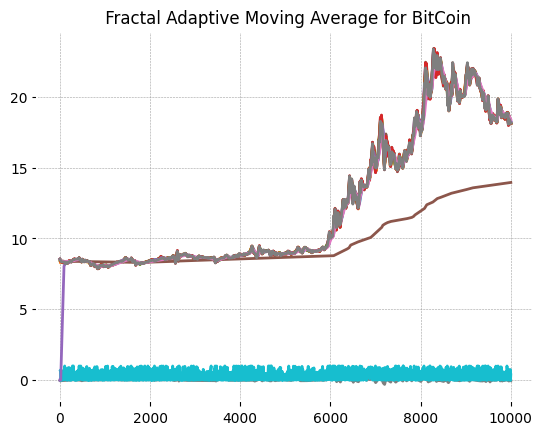

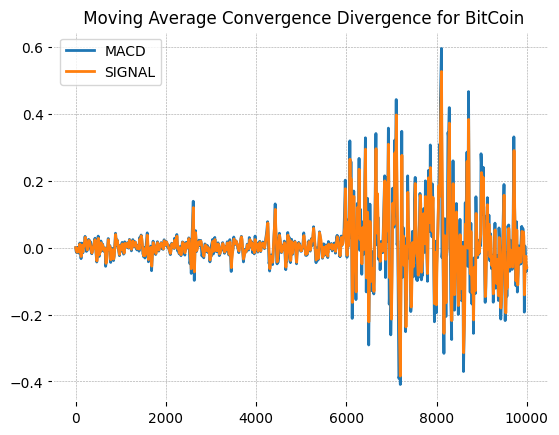

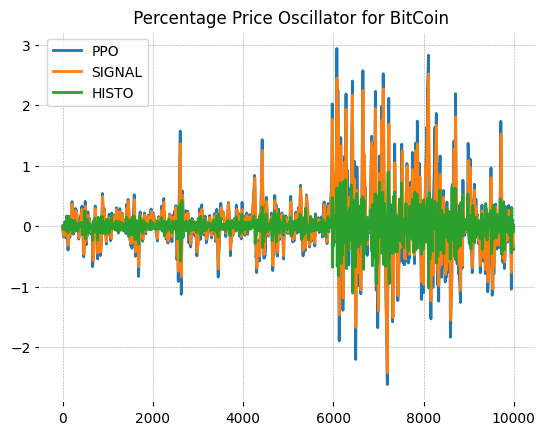

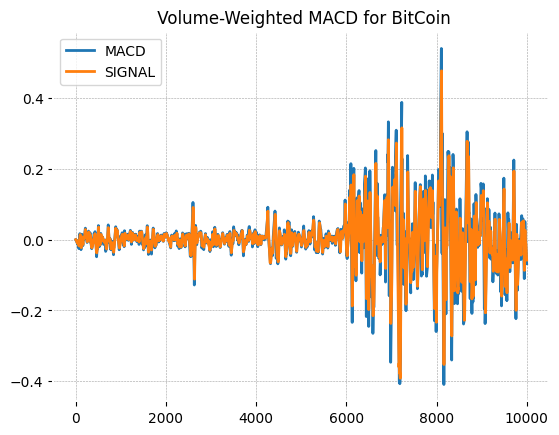

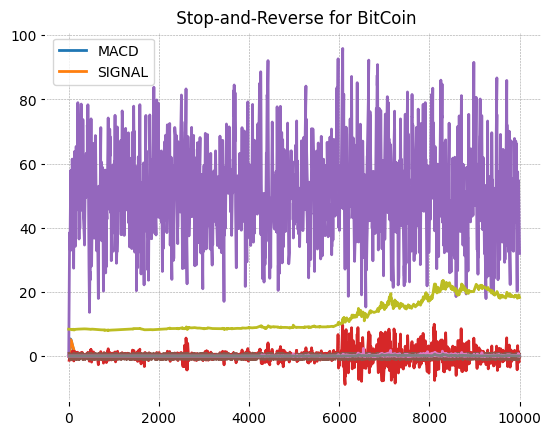

...

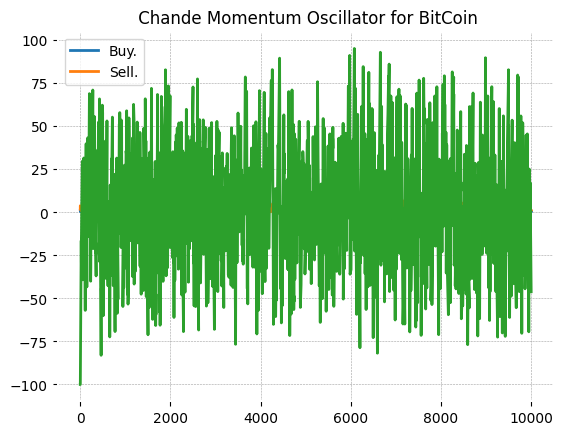

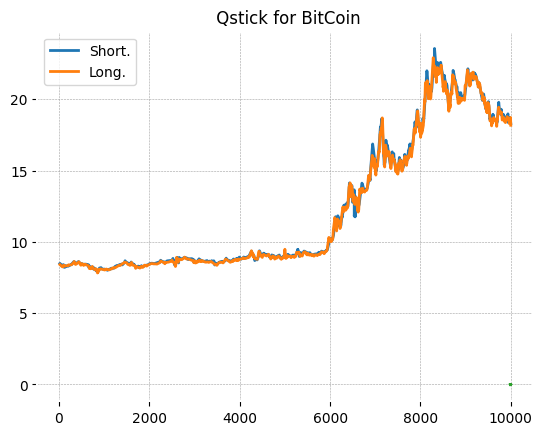

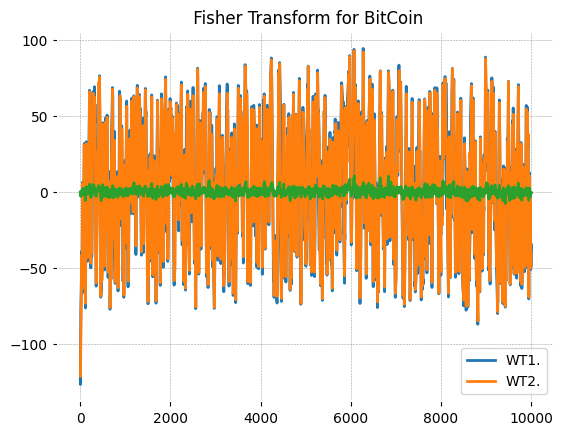

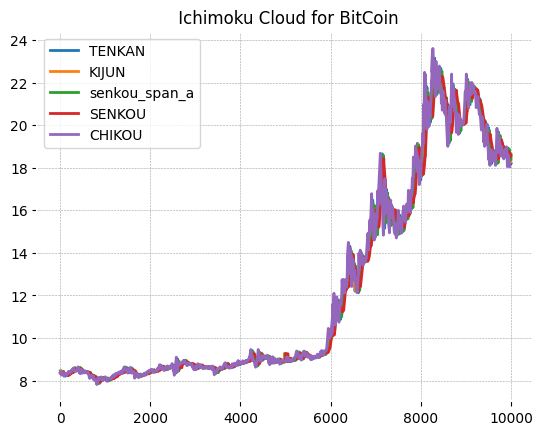

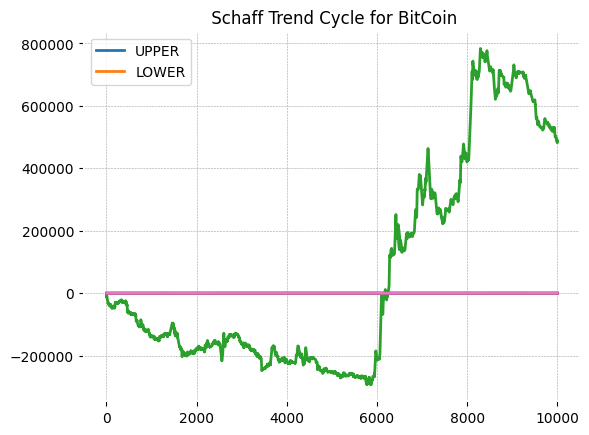

In [31]:
function_dict = {' Simple Moving Average ' : 'SMA',
                 ' Simple Moving Median ' : 'SMM',
                 ' Smoothed Simple Moving Average ' : 'SSMA',
                 ' Exponential Moving Average ' : 'EMA',
                 ' Double Exponential Moving Average ' : 'DEMA',
                 ' Triple Exponential Moving Average ' : 'TEMA',
                 ' Triangular Moving Average ' : 'TRIMA',
                 ' Triple Exponential Moving Average Oscillator ' : 'TRIX',
                 ' Volume Adjusted Moving Average ' : 'VAMA',
                 ' Kaufman Efficiency Indicator ' : 'ER',
                 ' Kaufmans Adaptive Moving Average ' : 'KAMA',
                 ' Zero Lag Exponential Moving Average ' : 'ZLEMA',
                 ' Weighted Moving Average ' : 'WMA',
                 ' Hull Moving Average ' : 'HMA',
                 ' Elastic Volume Moving Average ' : 'EVWMA',
                 ' Volume Weighted Average Price ' : 'VWAP',
                 ' Smoothed Moving Average ' : 'SMMA',
                 ' Fractal Adaptive Moving Average ' : 'FRAMA',
                 ' Moving Average Convergence Divergence ' : 'MACD',
                 ' Percentage Price Oscillator ' : 'PPO',
                 ' Volume-Weighted MACD ' : 'VW_MACD',
                 ' Elastic-Volume weighted MACD ' : 'EV_MACD',
                 ' Market Momentum ' : 'MOM',
                 ' Rate-of-Change ' : 'ROC',
                 ' Relative Strength Index ' : 'RSI',
                 ' Inverse Fisher Transform RSI ' : 'IFT_RSI',
                 ' True Range ' : 'TR',
                 ' Average True Range ' : 'ATR',
                 ' Stop-and-Reverse ' : 'SAR',
                 ' Bollinger Bands ' : 'BBANDS',
                 ' Bollinger Bands Width ' : 'BBWIDTH',
                 ' Momentum Breakout Bands ' : 'MOBO',
                 ' Percent B ' : 'PERCENT_B',
                 ' Keltner Channels ' : 'KC',
                 ' Donchian Channel ' : 'DO',
                 ' Directional Movement Indicator ' : 'DMI',
                 ' Average Directional Index ' : 'ADX',
                 ' Pivot Points ' : 'PIVOT',
                 ' Fibonacci Pivot Points ' : 'PIVOT_FIB',
                 ' Stochastic Oscillator Percent K ' : 'STOCH',
                 ' Stochastic oscillator Percent D ' : 'STOCHD',
                 ' Stochastic RSI ' : 'STOCHRSI',
                 ' Williams Percent R ' : 'WILLIAMS',
                 ' Ultimate Oscillator ' : 'UO',
                 ' Awesome Oscillator ' : 'AO',
                 ' Mass Index ' : 'MI',
                 ' Vortex Indicator ' : 'VORTEX',
                 ' Know Sure Thing ' : 'KST',
                 ' True Strength Index ' : 'TSI',
                 ' Typical Price ' : 'TP',
                 ' Accumulation-Distribution Line ' : 'ADL',
                 ' Chaikin Oscillator ' : 'CHAIKIN',
                 ' Money Flow Index ' : 'MFI',
                 ' On Balance Volume ' : 'OBV',
                 ' Weighter OBV ' : 'WOBV',
                 ' Volume Zone Oscillator ' : 'VZO',
                 ' Price Zone Oscillator ' : 'PZO',
                 ' Elders Force Index ' : 'EFI',
                 ' Cummulative Force Index ' : 'CFI',
                 ' Bull power and Bear Power ' : 'EBBP',
                 ' Ease of Movement ' : 'EMV',
                 ' Commodity Channel Index ' : 'CCI',
                 ' Coppock Curve ' : 'COPP',
                 ' Buy and Sell Pressure ' : 'BASP',
                 ' Normalized BASP ' : 'BASPN',
                 ' Chande Momentum Oscillator ' : 'CMO',
                 ' Chandelier Exit ' : 'CHANDELIER',
                 ' Qstick ' : 'QSTICK',
                 #' Twiggs Money Index ' : 'TMF',
                 ' Wave Trend Oscillator ' : 'WTO',
                 ' Fisher Transform ' : 'FISH',
                 ' Ichimoku Cloud ' : 'ICHIMOKU',
                 ' Adaptive Price Zone ' : 'APZ',
                 #' Squeeze Momentum Indicator ' : 'SQZMI',
                 ' Volume Price Trend ' : 'VPT',
                 ' Finite Volume Element ' : 'FVE',
                 ' Volume Flow Indicator ' : 'VFI',
                 ' Moving Standard deviation ' : 'MSD',
                 ' Schaff Trend Cycle ' : 'STC'}

for key, value in function_dict .items():
    function_name = "TA." + value + "(ohlc).plot(title='" + key + "for BitCoin')"
    result = eval(function_name)

# 8 BackTesting Trading Strategy

In [32]:
# Defining DEMA cross strategy
class DemaCross(Strategy):

    def init(self):

        self.ma1 = self.I(TA.DEMA, ohlc, 10)
        self.ma2 = self.I(TA.DEMA, ohlc, 20)

    def next(self):
        if crossover(self.ma1, self.ma2):
            self.buy()
        elif crossover(self.ma2, self.ma1):
            self.sell()

## Let us do a bit of backtesting with a value of $100000 

In [33]:
bt = Backtest(ohlc, DemaCross,
              cash=100000, commission=0.015, exclusive_orders=True)

## Back Testing Summary

In [34]:
bt.run()

Start                                     0.0
End                                    9999.0
Duration                               9999.0
Exposure Time [%]                       81.56
Equity Final [$]                    17.693822
Equity Peak [$]                      100000.0
Return [%]                         -99.982306
Buy & Hold Return [%]               111.61313
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -99.982307
Avg. Drawdown [%]                  -99.982307
Max. Drawdown Duration                 9987.0
Avg. Drawdown Duration                 9987.0
# Trades                                647.0
Win Rate [%]                         8.964451
Best Trade [%]                      10.352588
Worst Trade [%]                    -11.540711
Avg. Trade [%]                    

## Use Zoom to see the performance of the stock

In [35]:
bt.plot()

Row(id='1414', ...)

# 8.1 BackTesting Trading Strategy Using KNN

In [36]:
from backtesting import Strategy
from backtesting.lib import crossover
from backtesting.test import SMA
from backtesting.lib import plot_heatmaps

def BBANDS(data, n_lookback, n_std):
    """Bollinger bands indicator"""
    hlc3 = (data.High + data.Low + data.Close) / 3
    mean, std = hlc3.rolling(n_lookback).mean(), hlc3.rolling(n_lookback).std()
    upper = mean + n_std*std
    lower = mean - n_std*std
    return upper, lower



class Sma4Cross(Strategy):
    n1 = 50
    n2 = 100
    n_enter = 20
    n_exit = 10
    
    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
        self.sma_enter = self.I(SMA, self.data.Close, self.n_enter)
        self.sma_exit = self.I(SMA, self.data.Close, self.n_exit)
        
    def next(self):
        
        if not self.position:
            
            # On upwards trend, if price closes above
            # "entry" MA, go long
            
            # Here, even though the operands are arrays, this
            # works by implicitly comparing the two last values
            if self.sma1 > self.sma2:
                if crossover(self.data.Close, self.sma_enter):
                    self.buy()
                    
            # On downwards trend, if price closes below
            # "entry" MA, go short
            
            else:
                if crossover(self.sma_enter, self.data.Close):
                    self.sell()
        
        # But if we already hold a position and the price
        # closes back below (above) "exit" MA, close the position
        
        else:
            if (self.position.is_long and
                crossover(self.sma_exit, self.data.Close)
                or
                self.position.is_short and
                crossover(self.data.Close, self.sma_exit)):
                
                self.position.close()

# 8.2 BackTesting Trading Strategy Heatmaps

In [37]:
%%time 

from backtesting import Backtest
from backtesting.test import GOOG
from backtesting.lib import plot_heatmaps


backtest = Backtest(ohlc, Sma4Cross, commission=.002)

stats, heatmap = backtest.optimize(
    n1=range(10, 110, 10),
    n2=range(20, 210, 20),
    n_enter=range(15, 35, 5),
    n_exit=range(10, 25, 5),
    constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Equity Final [$]',
    max_tries=200,
    random_state=0,
    return_heatmap=True)

Backtest.optimize:   0%|          | 0/3 [00:00<?, ?it/s]

CPU times: user 874 ms, sys: 58.3 ms, total: 932 ms
Wall time: 1min 2s


In [38]:
heatmap

n1   n2   n_enter  n_exit
30   40   15       10        6419.805086
          25       20        6022.569754
     60   15       10        6490.928655
          20       10        4969.041253
     80   25       10        5515.750051
                                ...     
100  180  20       10        6560.920105
     200  25       10        8380.365342
                   15        7921.559302
                   20        7546.375881
          30       15        8933.035998
Name: Equity Final [$], Length: 205, dtype: float64

In [39]:
hm = heatmap.groupby(['n1', 'n2']).mean().unstack()
hm

n2,40,60,80,100,120,140,160,180,200
n1,,,,,,,,,
30,6221.18742,5729.984954,5269.014011,5327.991826,5117.848742,5033.388587,5638.216023,6227.844922,7760.784360
40,NaN,6122.493751,5621.225116,5706.287178,5588.684910,5234.365646,6687.803370,NaN,8302.815798
50,NaN,7280.957285,7318.711429,5902.212083,5280.389806,5331.303121,5739.919402,7610.555959,7750.476989
60,NaN,NaN,6277.654565,6862.583482,6462.149089,6084.632418,5863.641784,8855.227941,8148.335789
70,NaN,NaN,5187.832036,5414.851980,5926.266087,7291.001114,6463.014531,8398.896820,8361.516958
80,NaN,NaN,NaN,5927.638273,4844.539933,6699.880522,6831.933140,8175.939973,NaN
90,NaN,NaN,NaN,4904.489164,5248.274361,5738.997992,6018.213456,7894.563210,8520.338078
100,NaN,NaN,NaN,NaN,4819.573350,5867.245888,7090.973393,6560.920105,8195.334131


In [40]:
from backtesting.lib import plot_heatmaps


plot_heatmaps(heatmap, agg='mean')

Column(id='1955', ...)

In [41]:
%%capture

!pip install scikit-optimize  # This is a run-time dependency

In [42]:
%%time

stats_skopt, heatmap, optimize_result = backtest.optimize(
    n1=[10, 100],      # Note: For method="skopt", we
    n2=[20, 200],      # only need interval end-points
    n_enter=[10, 40],
    n_exit=[10, 30],
    constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Equity Final [$]',
    method='skopt',
    max_tries=200,
    random_state=0,
    return_heatmap=True,
    return_optimization=True)

Backtest.optimize:   0%|          | 0/200 [00:00<?, ?it/s]

CPU times: user 48.5 s, sys: 244 ms, total: 48.7 s
Wall time: 48.9 s


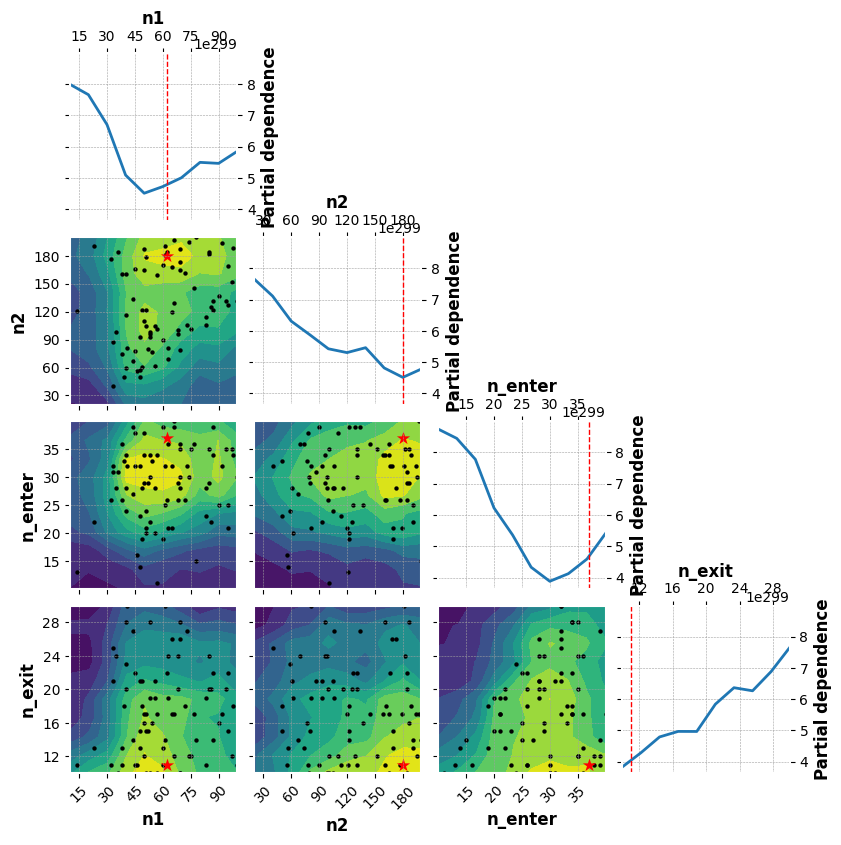

In [43]:
from skopt.plots import plot_objective

_ = plot_objective(optimize_result, n_points=10)

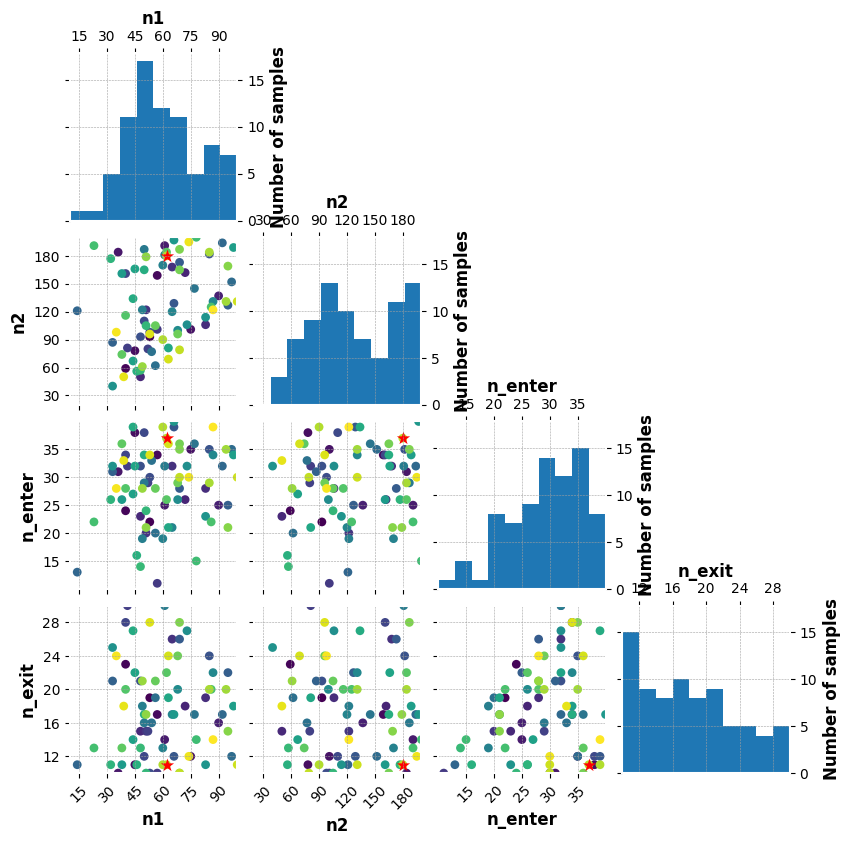

In [44]:
from skopt.plots import plot_evaluations

_ = plot_evaluations(optimize_result, bins=10)

## Work In Progress